# Regression Predict Student Solution

© Explore Data Science Academy

---
### Honour Code

I {**YOUR NAME, YOUR SURNAME**}, confirm - by submitting this document - that the solutions in this notebook are a result of my own work and that I abide by the [EDSA honour code](https://drive.google.com/file/d/1QDCjGZJ8-FmJE3bZdIQNwnJyQKPhHZBn/view?usp=sharing).

Non-compliance with the honour code constitutes a material breach of contract.

### Predict Overview: Spain Electricity Shortfall Challenge

The government of Spain is considering an expansion of it's renewable energy resource infrastructure investments. As such, they require information on the trends and patterns of the countries renewable sources and fossil fuel energy generation. Your company has been awarded the contract to:

- 1. analyse the supplied data;
- 2. identify potential errors in the data and clean the existing data set;
- 3. determine if additional features can be added to enrich the data set;
- 4. build a model that is capable of forecasting the three hourly demand shortfalls;
- 5. evaluate the accuracy of the best machine learning model;
- 6. determine what features were most important in the model’s prediction decision, and
- 7. explain the inner working of the model to a non-technical audience.

Formally the problem statement was given to you, the senior data scientist, by your manager via email reads as follow:

> In this project you are tasked to model the shortfall between the energy generated by means of fossil fuels and various renewable sources - for the country of Spain. The daily shortfall, which will be referred to as the target variable, will be modelled as a function of various city-specific weather features such as `pressure`, `wind speed`, `humidity`, etc. As with all data science projects, the provided features are rarely adequate predictors of the target variable. As such, you are required to perform feature engineering to ensure that you will be able to accurately model Spain's three hourly shortfalls.
 
On top of this, she has provided you with a starter notebook containing vague explanations of what the main outcomes are. 

<a id="cont"></a>

## Table of Contents

<a href=#one>1. Importing Packages</a>

<a href=#two>2. Loading Data</a>

<a href=#three>3. Exploratory Data Analysis (EDA)</a>

<a href=#four>4. Data Engineering</a>

<a href=#five>5. Modeling</a>

<a href=#six>6. Model Performance</a>

<a href=#seven>7. Model Explanations</a>

## Introduction
#### Spain electricity generation 2021
The Spanish grid was mainly powered by wind, nuclear, and combined cycle power plants in 2021, according to the latest studies. With a share of 23.3 percent, wind energy was the most commonly used source of electricity in Spain that year, followed closely by nuclear power, which took up almost 21 percent of the grid. Ranking also as an important energy generation source, combined cycle held a share of 17.1 percent. In contrast, waste-to-energy sources accounted for slightly over one percent of the grid.
#### Electricity production from renewable sources
During 2020, nearly half of the energy generated from renewable sources came from wind power, according to the latest reports. Electricity generation via hydropower represented 27.7 percent of all the electricity generated that year through renewable sources, making it the second most common on the list.
[Statista](https://www.statista.com/statistics/1007877/share-of-electricity-generation-in-spain/)
#### Chicken LTD
As a data science company that is specialised in building predictive models for various industries across the world, we have been tasked with creating a machine learning model that would help estimate the three-hourly load shortfall in Spain precisely. This information will aid the government in determining the level of investment needed for energy infrastructure.

#### The problem

In order to tackle climate change and ensure sustainability, the world is gearing up the usage of renewable energy resources. They will also ensure a constant supply of energy. This will lead to new markets, enterprises, and job opportunities and will provide greater options for improving standards of living for individuals, their families, and their communities. Due to the Russia/Ukraine war european countries and their economy as a whole suffer from a lack of reliable power supply.

#### Our objectives

* Explore and visualize the given dataset.
* Perform cleaning and engineering on the given dataset.
* Build advanced machine learning models that will predict the 3 hourly load shortfall.
* Assess the accuracy of the models.
* Choose the best model to make predictions.

#### Dataset Features
The dataset contains the following features:
1. Time: Weather conditions in each city at a particular date and time
2. Wind_speed: Wind speed in each city
3. Wind_deg: The direction of the wind in each city
4. Pressure: Atmospheric pressure in each city
5. Rain: The amount of rain in each city in 1 hour or 3 hours
6. Snow: The amount of snowfall in each city
7. Cloud_all: Percentage cloud coverage in each city

 <a id="one"></a>
## 1. Importing Packages
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Importing Packages ⚡ |
| :--------------------------- |
| In this section you are required to import, and briefly discuss, the libraries that will be used throughout your analysis and modelling. |

---

### Importing the required libraries to carry out our task
Python libraries in the below cell are imported to provide strong functionality and flexibility in performing tasks on the datasets. Pandas and numpy libraries are respectively imported to load and manupulate variables stored in the datasets in some stages of data science life cycle. Once data is loaded and manipulated; visuals can be made to check the distribution of data, outliers, and correlation to gather insights about the features and check relationships between them. Other libraries imported in the cell below enables the preparation of data for model building. These libraries makes the scaling of models easy

In [1]:
import codes as cd
from sklearn.preprocessing import StandardScaler
from sklearn.linear_model import LinearRegression
from sklearn.model_selection import train_test_split
from sklearn import metrics 
from sklearn.tree import DecisionTreeRegressor
from sklearn.metrics import accuracy_score
from sklearn.feature_selection import SelectKBest
from sklearn.feature_selection import chi2
from sklearn.metrics import mean_squared_error as MSE
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score
from sklearn.preprocessing import StandardScaler
from sklearn.svm import SVR
from sklearn.neural_network import MLPRegressor
from sklearn import svm
import plotly.express as px
import math
from statsmodels.graphics.correlation import plot_corr
import statsmodels.formula.api as sm
from statsmodels.formula.api import ols
from scipy.stats import pearsonr
from sklearn.linear_model import Lasso
from sklearn.linear_model import Ridge
from sklearn.metrics import classification_report
from sklearn.model_selection import KFold
from sklearn.datasets import load_breast_cancer
from sklearn.ensemble import GradientBoostingClassifier

In [2]:
#cd.pd.set_option('display.max_columns', None)
#cd.pd.set_option('display.max_rows', None)
#cd.pd.options.display.float_format = '{:.2f}'.format

<a id="two"></a>
## 2. Loading the Data
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Loading the data ⚡ |
| :--------------------------- |
| In this section you are required to load the data from the `df_train` file into a DataFrame. |

---

Loading the spain weather train and test datasets csv files into DataFrames and assign variable name to them, df_1 and df_2 respectively.

In [3]:
df_1 = cd.pd.read_csv('df_train.csv') # load the train data
df_2 = cd.pd.read_csv('df_test.csv') # load the test data

##### Creating a copy of the data to avoid making permanent changes to the data
Copies of the train and test datasets are created in the cell below to avoid messing up the datsets during the cleaning operations and also to make sure that the original datasets are safe incase of a technical glitch that maybe results in the loss of data.

In [4]:
df_train = df_1.copy() # Copy of the train data
df_test = df_2.copy() # Copy of the test data

In [5]:
df_train.columns = df_train.columns.str.lower()
df_test.columns = df_test.columns.str.lower()

<a id="three"></a>
## 3. Exploratory Data Analysis (EDA)
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Exploratory data analysis ⚡ |
| :--------------------------- |
| In this section, you are required to perform an in-depth analysis of all the variables in the DataFrame. |

---


EDA is a process and it can take quite some time depending on size and nature of data ones is dealing with. Operations in this process includes investigating the data to discover its patterns, spot anomalies, test some hypotheses, and check assumptions. The above mentioned are made possible with the use of summary statistics and graphical representations. This step is crucial and its about making sense of the data before getting it dirty.

In [6]:
df_train.head()

,unnamed: 0,time,madrid_wind_speed,valencia_wind_deg,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,...,madrid_temp_max,barcelona_temp,bilbao_temp_min,bilbao_temp,barcelona_temp_min,bilbao_temp_max,seville_temp_min,madrid_temp,madrid_temp_min,load_shortfall_3h
0,0,2015-01-01 03:00:00,0.666667,level_5,0.0,0.666667,74.333333,64.000000,0.0,1.000000,...,265.938000,281.013000,269.338615,269.338615,281.013000,269.338615,274.254667,265.938000,265.938000,6715.666667
1,1,2015-01-01 06:00:00,0.333333,level_10,0.0,1.666667,78.333333,64.666667,0.0,1.000000,...,266.386667,280.561667,270.376000,270.376000,280.561667,270.376000,274.945000,266.386667,266.386667,4171.666667
2,2,2015-01-01 09:00:00,1.000000,level_9,0.0,1.000000,71.333333,64.333333,0.0,1.000000,...,272.708667,281.583667,275.027229,275.027229,281.583667,275.027229,278.792000,272.708667,272.708667,4274.666667
3,3,2015-01-01 12:00:00,1.000000,level_8,0.0,1.000000,65.333333,56.333333,0.0,1.000000,...,281.895219,283.434104,281.135063,281.135063,283.434104,281.135063,285.394000,281.895219,281.895219,5075.666667
4,4,2015-01-01 15:00:00,1.000000,level_7,0.0,1.000000,59.000000,57.000000,2.0,0.333333,...,280.678437,284.213167,282.252063,282.252063,284.213167,282.252063,285.513719,280.678437,280.678437,6620.666667


Observations:

There is an unnamed column that has the same value with the index value as seen above, this column is insignificant to our use case.

Column names have a mix of upper and lower case letters.

All wind_deg and pressure columns are supposed to be expressed as a category according to the (features) data description on Kaggle.

The weather id columns are insignificant to our use case.



**Checking the train data shape** 

The cells below checks the actual number of rows and columns of spain weather features inside the train dataset.

In [7]:
df_train.shape

(8763, 49)

Observation:
The shape of the train data set indcates 8763 rows and 49 columns.

**Checking the data types in train dataset**

In the cell below, datatypes of weather features stored in train datasets are checked. This highlights the importance of knowing the type of data being dealt with and this will shed light on how to work with and manipulate it.

In [8]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 49 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unnamed: 0            8763 non-null   int64  
 1   time                  8763 non-null   object 
 2   madrid_wind_speed     8763 non-null   float64
 3   valencia_wind_deg     8763 non-null   object 
 4   bilbao_rain_1h        8763 non-null   float64
 5   valencia_wind_speed   8763 non-null   float64
 6   seville_humidity      8763 non-null   float64
 7   madrid_humidity       8763 non-null   float64
 8   bilbao_clouds_all     8763 non-null   float64
 9   bilbao_wind_speed     8763 non-null   float64
 10  seville_clouds_all    8763 non-null   float64
 11  bilbao_wind_deg       8763 non-null   float64
 12  barcelona_wind_speed  8763 non-null   float64
 13  barcelona_wind_deg    8763 non-null   float64
 14  madrid_clouds_all     8763 non-null   float64
 15  seville_wind_speed   

**Checking descriptive statistics of train dataset**

In the cell below, the data is described in a table using summary statistics just to get a sense of what the train spain weather data looks like. Data is described in terms of count of values, minimum and maximum values, mean, standard deviation and percentiles (25%, 50%, 75%).

In [9]:
df_train.describe()

,unnamed: 0,madrid_wind_speed,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,seville_clouds_all,bilbao_wind_deg,...,madrid_temp_max,barcelona_temp,bilbao_temp_min,bilbao_temp,barcelona_temp_min,bilbao_temp_max,seville_temp_min,madrid_temp,madrid_temp_min,load_shortfall_3h
count,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,...,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000,8763.000000
mean,4381.000000,2.425729,0.135753,2.586272,62.658793,57.414717,43.469132,1.850356,13.714748,158.957511,...,289.540309,289.855459,285.017973,286.422929,288.447422,287.966027,291.633356,288.419439,287.202203,10673.857612
std,2529.804538,1.850371,0.374901,2.411190,22.621226,24.335396,32.551044,1.695888,24.272482,102.056299,...,9.752047,6.528111,6.705672,6.818682,6.102593,7.105590,8.178220,9.346796,9.206237,5218.046404
min,0.000000,0.000000,0.000000,0.000000,8.333333,6.333333,0.000000,0.000000,0.000000,0.000000,...,264.983333,270.816667,264.483333,267.483333,269.483333,269.063000,270.150000,264.983333,264.983333,-6618.000000
25%,2190.500000,1.000000,0.000000,1.000000,44.333333,36.333333,10.000000,0.666667,0.000000,73.333333,...,282.150000,284.973443,280.085167,281.374167,284.150000,282.836776,285.816667,281.404281,280.299167,7390.333333
50%,4381.000000,2.000000,0.000000,1.666667,65.666667,58.000000,45.000000,1.000000,0.000000,147.000000,...,288.116177,289.416667,284.816667,286.158333,288.150000,287.630000,290.816667,287.053333,286.083333,11114.666667
75%,6571.500000,3.333333,0.100000,3.666667,82.000000,78.666667,75.000000,2.666667,20.000000,234.000000,...,296.816667,294.909000,289.816667,291.034167,292.966667,292.483333,297.150000,295.154667,293.884500,14498.166667
max,8762.000000,13.000000,3.000000,52.000000,100.000000,100.000000,100.000000,12.666667,97.333333,359.333333,...,314.483333,307.316667,309.816667,310.710000,304.816667,317.966667,314.816667,313.133333,310.383333,31904.000000


**Checking the number of nulls in train data**

The command in the cell below checks and output the number of null values found within the columns of weather features in  train datasets.

In [10]:
df_train.isnull().sum()

unnamed: 0                 0
time                       0
madrid_wind_speed          0
valencia_wind_deg          0
bilbao_rain_1h             0
valencia_wind_speed        0
seville_humidity           0
madrid_humidity            0
bilbao_clouds_all          0
bilbao_wind_speed          0
seville_clouds_all         0
bilbao_wind_deg            0
barcelona_wind_speed       0
barcelona_wind_deg         0
madrid_clouds_all          0
seville_wind_speed         0
barcelona_rain_1h          0
seville_pressure           0
seville_rain_1h            0
bilbao_snow_3h             0
barcelona_pressure         0
seville_rain_3h            0
madrid_rain_1h             0
barcelona_rain_3h          0
valencia_snow_3h           0
madrid_weather_id          0
barcelona_weather_id       0
bilbao_pressure            0
seville_weather_id         0
valencia_pressure       2068
seville_temp_max           0
madrid_pressure            0
valencia_temp_max          0
valencia_temp              0
bilbao_weather

Observation: Valencia_pressure has 2068 null values in the train dataset.

**Checking duplicates**

The command below in the cell checks the number of duplicated data points measurement in the dataset. 

In [11]:
df_train.duplicated().sum()

0

**Checking the data types of train weather features**

The cell below outputs the data type of weather features stored in train datasets from the time measurements were taken. 

In [12]:
df_train.dtypes

unnamed: 0                int64
time                     object
madrid_wind_speed       float64
valencia_wind_deg        object
bilbao_rain_1h          float64
valencia_wind_speed     float64
seville_humidity        float64
madrid_humidity         float64
bilbao_clouds_all       float64
bilbao_wind_speed       float64
seville_clouds_all      float64
bilbao_wind_deg         float64
barcelona_wind_speed    float64
barcelona_wind_deg      float64
madrid_clouds_all       float64
seville_wind_speed      float64
barcelona_rain_1h       float64
seville_pressure         object
seville_rain_1h         float64
bilbao_snow_3h          float64
barcelona_pressure      float64
seville_rain_3h         float64
madrid_rain_1h          float64
barcelona_rain_3h       float64
valencia_snow_3h        float64
madrid_weather_id       float64
barcelona_weather_id    float64
bilbao_pressure         float64
seville_weather_id      float64
valencia_pressure       float64
seville_temp_max        float64
madrid_p

In [13]:
df_test.head()

,unnamed: 0,time,madrid_wind_speed,valencia_wind_deg,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,...,barcelona_temp_max,madrid_temp_max,barcelona_temp,bilbao_temp_min,bilbao_temp,barcelona_temp_min,bilbao_temp_max,seville_temp_min,madrid_temp,madrid_temp_min
0,8763,2018-01-01 00:00:00,5.000000,level_8,0.0,5.000000,87.000000,71.333333,20.000000,3.000000,...,287.816667,280.816667,287.356667,276.150000,280.380000,286.816667,285.150000,283.150000,279.866667,279.150000
1,8764,2018-01-01 03:00:00,4.666667,level_8,0.0,5.333333,89.000000,78.000000,0.000000,3.666667,...,284.816667,280.483333,284.190000,277.816667,281.010000,283.483333,284.150000,281.150000,279.193333,278.150000
2,8765,2018-01-01 06:00:00,2.333333,level_7,0.0,5.000000,89.000000,89.666667,0.000000,2.333333,...,284.483333,276.483333,283.150000,276.816667,279.196667,281.816667,282.150000,280.483333,276.340000,276.150000
3,8766,2018-01-01 09:00:00,2.666667,level_7,0.0,5.333333,93.333333,82.666667,26.666667,5.666667,...,284.150000,277.150000,283.190000,279.150000,281.740000,282.150000,284.483333,279.150000,275.953333,274.483333
4,8767,2018-01-01 12:00:00,4.000000,level_7,0.0,8.666667,65.333333,64.000000,26.666667,10.666667,...,287.483333,281.150000,286.816667,281.816667,284.116667,286.150000,286.816667,284.483333,280.686667,280.150000


**Checking the train data shape** 

The cells below checks the actual number of rows and columns of spain weather features inside the testdataset.

In [14]:
df_test.shape

(2920, 48)

Observation: The shape of the test data set indcates 2920 rows and 48 columns.


**Checking the data types in test dataset**

In the cell below, datatypes of weather features stored in test datasets are checked. This highlights the importance of knowing the type of data being dealt with and this will shed light on how to work with and manipulate it.


In [15]:
df_test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 2920 entries, 0 to 2919
Data columns (total 48 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   unnamed: 0            2920 non-null   int64  
 1   time                  2920 non-null   object 
 2   madrid_wind_speed     2920 non-null   float64
 3   valencia_wind_deg     2920 non-null   object 
 4   bilbao_rain_1h        2920 non-null   float64
 5   valencia_wind_speed   2920 non-null   float64
 6   seville_humidity      2920 non-null   float64
 7   madrid_humidity       2920 non-null   float64
 8   bilbao_clouds_all     2920 non-null   float64
 9   bilbao_wind_speed     2920 non-null   float64
 10  seville_clouds_all    2920 non-null   float64
 11  bilbao_wind_deg       2920 non-null   float64
 12  barcelona_wind_speed  2920 non-null   float64
 13  barcelona_wind_deg    2920 non-null   float64
 14  madrid_clouds_all     2920 non-null   float64
 15  seville_wind_speed   

**Checking descriptive statistics of test dataset**

In the cell below, the data is described in a table using summary statistics just to get a sense of what the test spain weather data looks like. Data is described in terms of count of values, minimum and maximum values, mean, standard deviation and percentiles (25%, 50%, 75%).

In [16]:
df_test.describe()

,unnamed: 0,madrid_wind_speed,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,seville_clouds_all,bilbao_wind_deg,...,barcelona_temp_max,madrid_temp_max,barcelona_temp,bilbao_temp_min,bilbao_temp,barcelona_temp_min,bilbao_temp_max,seville_temp_min,madrid_temp,madrid_temp_min
count,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,...,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000,2920.000000
mean,10222.500000,2.457820,0.067517,3.012785,67.123516,62.644463,43.355422,2.283562,15.477283,162.643836,...,290.695462,288.888393,289.911289,284.920684,286.522375,289.124971,288.483641,290.152431,287.869763,286.618130
std,843.075718,1.774838,0.153381,1.996340,20.611292,24.138393,30.486298,1.654787,25.289197,97.749873,...,7.113599,9.089699,7.119411,6.803424,6.492355,7.168049,6.221324,7.906915,8.977511,8.733163
min,8763.000000,0.000000,0.000000,0.000000,11.666667,8.000000,0.000000,0.000000,0.000000,0.000000,...,273.816667,269.816667,272.650000,266.483333,268.120000,271.483333,270.138667,271.150000,268.713333,267.816667
25%,9492.750000,1.333333,0.000000,1.666667,52.000000,43.000000,13.333333,1.000000,0.000000,86.666667,...,284.816667,281.483333,284.307500,280.150000,281.778333,283.483333,284.150000,284.483333,280.816667,279.816667
50%,10222.500000,2.000000,0.000000,2.333333,70.333333,63.000000,45.000000,1.666667,0.000000,140.000000,...,290.150000,287.483333,289.483333,284.483333,286.265000,288.816667,288.483333,289.150000,286.396667,285.483333
75%,10952.250000,3.333333,0.000000,4.000000,85.000000,84.000000,75.000000,3.333333,20.000000,233.333333,...,296.483333,295.483333,295.816667,289.816667,291.119167,295.150000,292.816667,295.150000,294.452500,293.150000
max,11682.000000,13.333333,1.600000,14.333333,100.000000,100.000000,97.333333,10.666667,93.333333,360.000000,...,309.483333,313.483333,308.150000,307.483333,308.966667,306.816667,310.816667,314.483333,312.223333,310.150000


**Checking the number of nulls in test data**

The command in the cell below checks and output the number of null values found within the columns of weather features in  test datasets.

In [17]:
df_test.isnull().sum()

unnamed: 0                0
time                      0
madrid_wind_speed         0
valencia_wind_deg         0
bilbao_rain_1h            0
valencia_wind_speed       0
seville_humidity          0
madrid_humidity           0
bilbao_clouds_all         0
bilbao_wind_speed         0
seville_clouds_all        0
bilbao_wind_deg           0
barcelona_wind_speed      0
barcelona_wind_deg        0
madrid_clouds_all         0
seville_wind_speed        0
barcelona_rain_1h         0
seville_pressure          0
seville_rain_1h           0
bilbao_snow_3h            0
barcelona_pressure        0
seville_rain_3h           0
madrid_rain_1h            0
barcelona_rain_3h         0
valencia_snow_3h          0
madrid_weather_id         0
barcelona_weather_id      0
bilbao_pressure           0
seville_weather_id        0
valencia_pressure       454
seville_temp_max          0
madrid_pressure           0
valencia_temp_max         0
valencia_temp             0
bilbao_weather_id         0
seville_temp        

Observation: Valencia_pressure has 454 null values in the test dataset.

**DATA VISUALIZATION**

Visualization helps us to see patterns, interact with, and better understand the data. Whether simple or complex, the right visualization can bring everyone on the same page, regardless of their level of expertise. Visualization is generally useful for data cleaning, exploring data structure, detecting outliers and unusual groups, identifying trends and clusters, spotting local patterns, evaluating modeling output, and presenting results. It is also essential for exploratory data analysis and data mining to check data quality.

**Checking the skewness of data**

Datasets in most cases are rarely evenly distributed, checking for skewness within weather features in the train and test datasets datasets helps to create better and more accurate models by highlighting the need for "data cleaning" to engineer data in confined ranges. Skewness disregards model assumptions or lowers the importance of a dataset feature. Skewness gives the direction of the outliers if it is right-skewed or left-skewed.

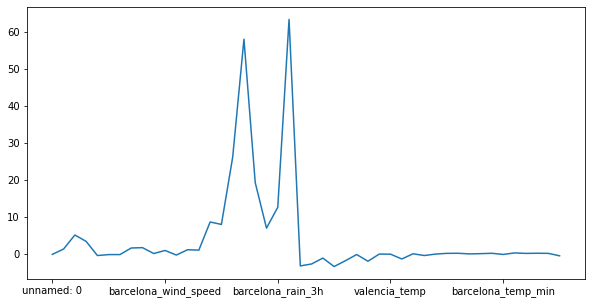

In [18]:
#Train dataset
cd.plt.figure(figsize = [10,5])
df_train.skew(axis=0, skipna=True).plot();

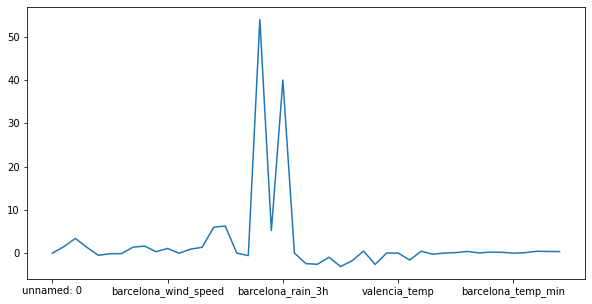

In [19]:
#Test dataset
cd.plt.figure(figsize = [10,5])
df_test.skew(axis=0, skipna=True).plot();

#### Here we split the data according to features measured to compare all records

Lambda functions in the following cells are derived to group weather features in both train and test datasets based on variables of interest which are weather features. It was neccessary to do this because it helps in oganizing data groups and makes the action of locating variables easy. This way insights through observations can be gathered about a certain variable, weather features between different cities of spain.

In [20]:
wind_speed_train = df_train[[x for x in df_train.columns if 'wind_speed' in x]]

In [21]:
wind_speed_test = df_test[[x for x in df_test.columns if 'wind_speed' in x]]

In [22]:
wind_degree_train = df_train[[x for x in df_train.columns if 'wind_deg' in x]]

In [23]:
wind_degree_test = df_test[[x for x in df_test.columns if 'wind_deg' in x]]

In [24]:
rain_1h_train = df_train[[x for x in df_train.columns if 'rain_1h' in x]]

In [25]:
rain_1h_test = df_test[[x for x in df_test.columns if 'rain_1h' in x]]

In [26]:
rain_3h_train = df_train[[x for x in df_train.columns if 'rain_3h' in x]]

In [27]:
rain_3h_test = df_test[[x for x in df_test.columns if 'rain_3h' in x]]

In [28]:
humidity_train = df_train[[x for x in df_train.columns if 'humidity' in x]]

In [29]:
humidity_test = df_test[[x for x in df_test.columns if 'humidity' in x]]

In [30]:
clouds_all_train = df_train[[x for x in df_train.columns if 'clouds_all' in x]]

In [31]:
clouds_all_test = df_test[[x for x in df_test.columns if 'clouds_all' in x]]

In [32]:
pressure_train = df_train[[x for x in df_train.columns if 'pressure' in x]]

In [33]:
pressure_test = df_test[[x for x in df_test.columns if 'pressure' in x]]

In [34]:
snow_3h_train = df_train[[x for x in df_train.columns if 'snow_3h' in x]]

In [35]:
snow_3h_test = df_test[[x for x in df_test.columns if 'snow_3h' in x]]

In [36]:
weather_id_train = df_train[[x for x in df_train.columns if 'weather_id' in x]]

In [37]:
weather_id_test = df_test[[x for x in df_test.columns if 'weather_id' in x]]

In [38]:
temp_max_train = df_train[[x for x in df_train.columns if 'temp_max' in x]]

In [39]:
temp_max_test = df_test[[x for x in df_test.columns if 'temp_max' in x]]

In [40]:
temp_train = df_train[[x for x in df_train.columns if "temp" in x and 'max' not in x and 'min' not in x]]

In [41]:
temp_test = df_test[[x for x in df_test.columns if "temp" in x and 'max' not in x and 'min' not in x]]

In [42]:
temp_min_train = df_train[[x for x in df_train.columns if 'temp_min' in x]]

In [43]:
temp_min_test = df_test[[x for x in df_test.columns if 'temp_min' in x]]

In [44]:
temp_test = df_test[[x for x in df_test.columns if 'temp' in x]]

In [45]:
df_train.select_dtypes(include=[object]).columns.sort_values()

Index(['seville_pressure', 'time', 'valencia_wind_deg'], dtype='object')

**Data visualization prior cleaning**

Visualizations are useful in many processes such as data cleaning, exploratory data analysis. Here visualizations are made before data cleaning to investigate the nature or quality of the data being dealt with. In this way, its very easy to gather insights by noticing data points that are out of range and observe the types of distribution about data as well as skewness. This activity was necessary to do because it shed light on data cleaning process, in terms of what to look out for and structuring the cleaning process. The types of plots made in this phase include box plot, histogram, kernel density estimation, and barchat.

Box plot: Divide data into approximately 25% segments in the dataset to provide a visual summary of the data to quickly identify mean values, the dispersion of the data set, and signs of skewness.

Histogram: Useful for detecting any unusual observations (outliers) or any gaps in the data and often used to illustrate major features of the distribution.

Kernel density estimation: Represents the probability distribution of the data values as the area under the plotted curve. It was used for hot spot detection in the data.

Barchat: Compare different sets of data among different groups easily (e.g. count vs pressure). Useful to compare different categories or discrete variables.


***Barcelona***

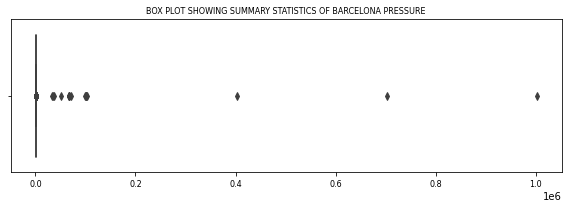

In [46]:
#Box plot for pressure summary statistics
cd.plot_boxplot(df_train, x_axis = 'barcelona_pressure', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of barcelona pressure", tick_fontsize = 8)

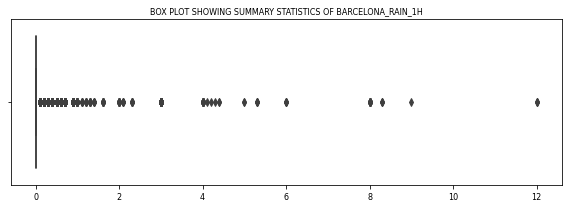

In [47]:
#Box plot for barcelona_rain_1h
cd.plot_boxplot(df_train, x_axis = 'barcelona_rain_1h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of barcelona_rain_1h", tick_fontsize = 8)

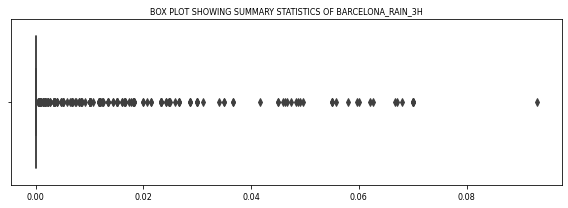

In [48]:
#Box plot for barcelona_rain_3h
cd.plot_boxplot(df_train, x_axis = 'barcelona_rain_3h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of barcelona_rain_3h", tick_fontsize = 8)

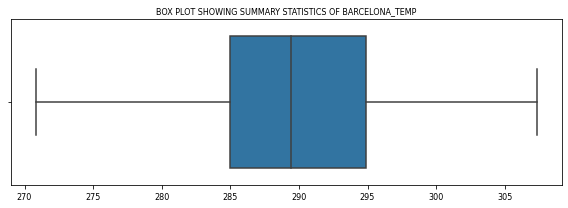

In [49]:
#Box plot for barcelona_temperature
cd.plot_boxplot(df_train, x_axis = 'barcelona_temp', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of barcelona_temp", tick_fontsize = 8)

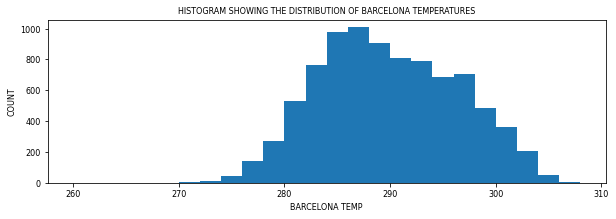

In [50]:
#Histogram for barcelona_temp
cd.plt_plot_hist(df_train, 'barcelona_temp', bin_num = 2, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of barcelona temperatures", x_label = 'barcelona temp', 
                 bin_edge = 260, y_label ='count')

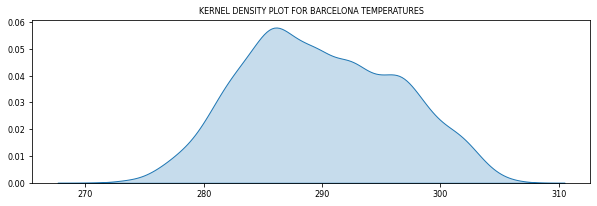

In [51]:
#Kernel density plot for barcelona_temperature
cd.plot_kde(df_train, x_axis = 'barcelona_temp',  plot_title = 'kernel density plot for barcelona temperatures',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

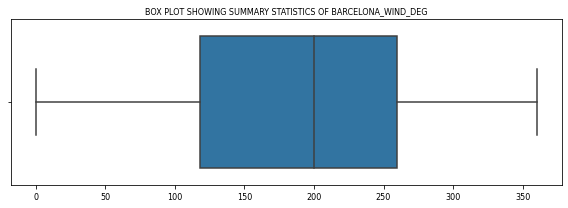

In [52]:
#Box plot for barcelona wind degree
cd.plot_boxplot(df_train, x_axis = 'barcelona_wind_deg', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of barcelona_wind_deg", tick_fontsize = 8)

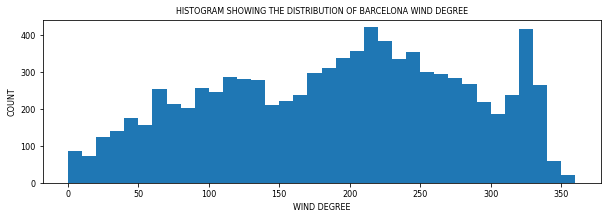

In [53]:
#Histogram for barcelona wind degree
cd.plt_plot_hist(df_train, 'barcelona_wind_deg', bin_num = 10, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of barcelona wind degree", x_label = 'wind degree', 
                 y_label ='count')

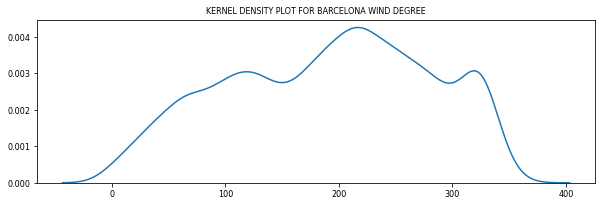

In [54]:
#Kernel density plot for barcelona wind degree
cd.plot_kde(df_train, x_axis = 'barcelona_wind_deg',  plot_title = 'kernel density plot for barcelona wind degree',
         should_fill = False, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

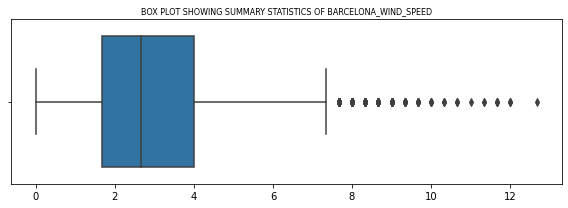

In [55]:
#Box plot for barcelona wind speed
cd.plot_boxplot(df_train, x_axis = 'barcelona_wind_speed', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of barcelona_wind_speed", tick_fontsize = 10)

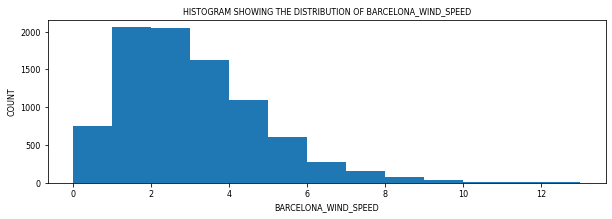

In [56]:
#Histogram for barcelona wind speed
cd.plt_plot_hist(df_train, 'barcelona_wind_speed', bin_num = 1, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of barcelona_wind_speed", x_label = 'barcelona_wind_speed', 
                 y_label ='count')

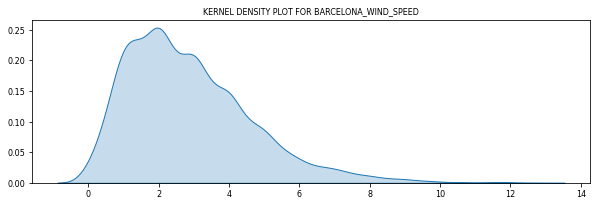

In [57]:
#Kernel density plot for barcelona wind speed
cd.plot_kde(df_train, x_axis = 'barcelona_wind_speed',  plot_title = 'kernel density plot for barcelona_wind_speed',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

***Bilbao***

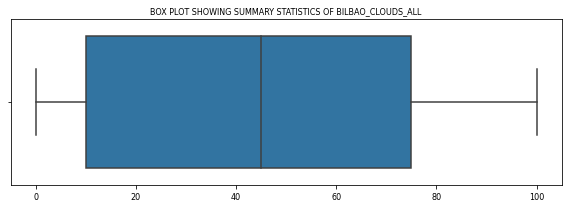

In [58]:
#Box plot for Bilbao clouds
cd.plot_boxplot(df_train, x_axis = 'bilbao_clouds_all', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_clouds_all", tick_fontsize = 8)

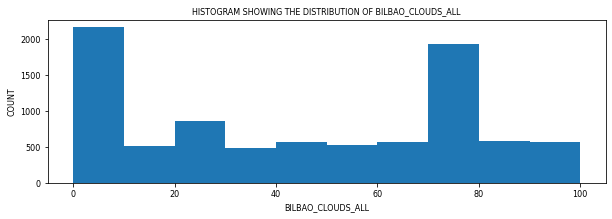

In [59]:
#Histogram for Bilbao clouds
cd.plt_plot_hist(df_train, 'bilbao_clouds_all', bin_num = 10, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_clouds_all", x_label = 'bilbao_clouds_all', 
                 y_label ='count')

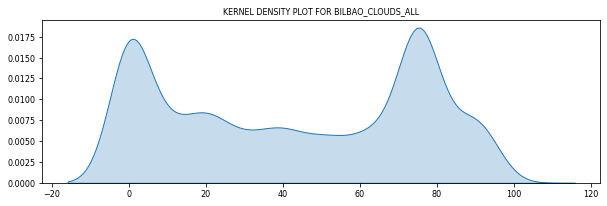

In [60]:
#Kernel density for Bilbao clouds
cd.plot_kde(df_train, x_axis = 'bilbao_clouds_all',  plot_title = 'kernel density plot for bilbao_clouds_all',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

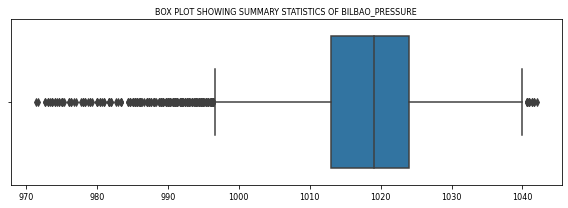

In [61]:
#Box plot for Bilbao pressure
cd.plot_boxplot(df_train, x_axis = 'bilbao_pressure', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_pressure", tick_fontsize = 8)

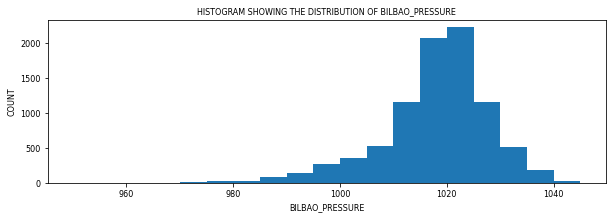

In [62]:
#Histogram for Bilbao pressure
cd.plt_plot_hist(df_train, 'bilbao_pressure', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_pressure", x_label = 'bilbao_pressure',  
                 bin_edge = 950, y_label ='count')

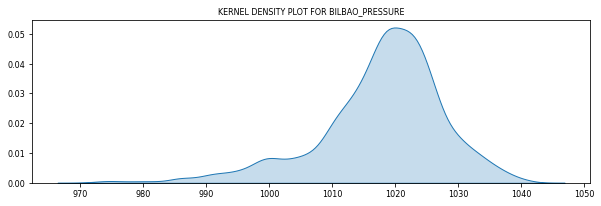

In [63]:
#Kernel density plot for Bilbao pressure
cd.plot_kde(df_train, x_axis = 'bilbao_pressure',  plot_title = 'kernel density plot for bilbao_pressure',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

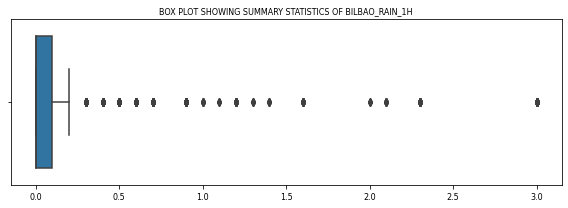

In [64]:
#Box plot for Bilbao rain_1h
cd.plot_boxplot(df_train, x_axis = 'bilbao_rain_1h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_rain_1h", tick_fontsize = 8)

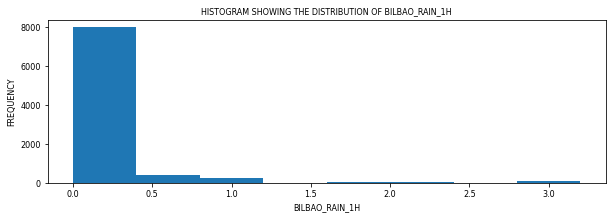

In [65]:
#Histogram for Bilbao rain_1h
cd.plt_plot_hist(df_train, 'bilbao_rain_1h', bin_num = 0.4, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_rain_1h", x_label = 'bilbao_rain_1h',  
                 bin_edge = 0, y_label ='frequency')

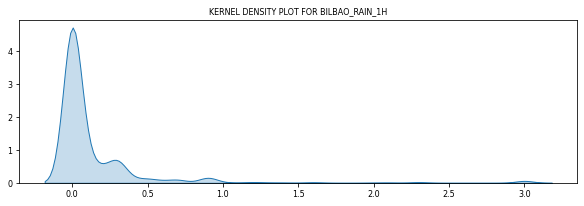

In [66]:
#Box plot for Bilbao rain_1h
cd.plot_kde(df_train, x_axis = 'bilbao_rain_1h',  plot_title = 'kernel density plot for bilbao_rain_1h',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

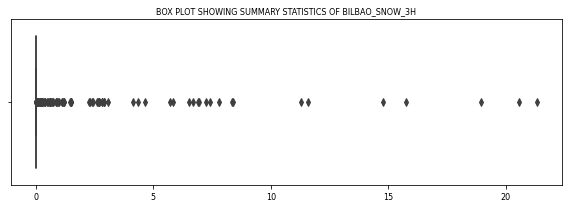

In [67]:
#Box plot for Bilbao snow_3h
cd.plot_boxplot(df_train, x_axis = 'bilbao_snow_3h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_snow_3h", tick_fontsize = 8)

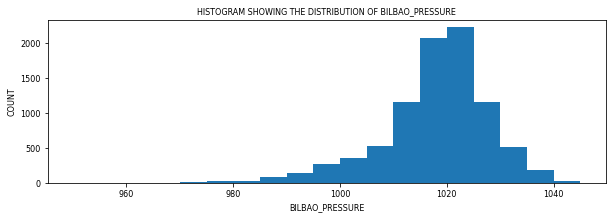

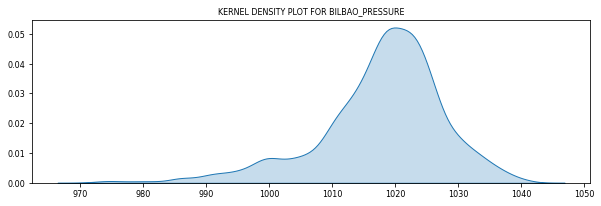

In [68]:
#Histogram for Bilbao pressure
cd.plt_plot_hist(df_train, 'bilbao_pressure', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_pressure", x_label = 'bilbao_pressure',  
                 bin_edge = 950, y_label ='count')
#Kernel density plot for Bilbao pressure
cd.plot_kde(df_train, x_axis = 'bilbao_pressure',  plot_title = 'kernel density plot for bilbao_pressure',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

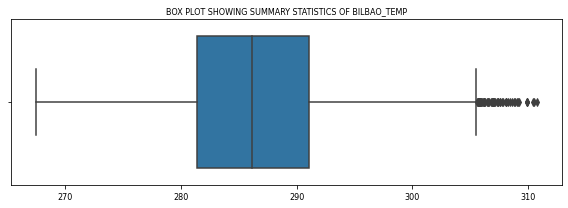

In [69]:
#Box plot for Bilbao temperature
cd.plot_boxplot(df_train, x_axis = 'bilbao_temp', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_temp", tick_fontsize = 8)

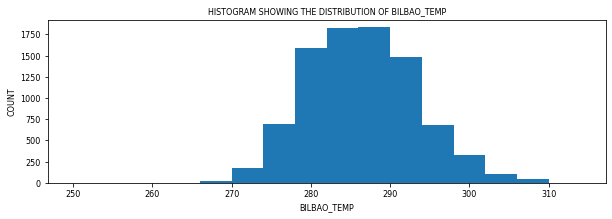

In [70]:
#Histogram for Bilbao temperature
cd.plt_plot_hist(df_train, 'bilbao_temp', bin_num = 4, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_temp", x_label = 'bilbao_temp',  
                 bin_edge = 250, y_label ='count')

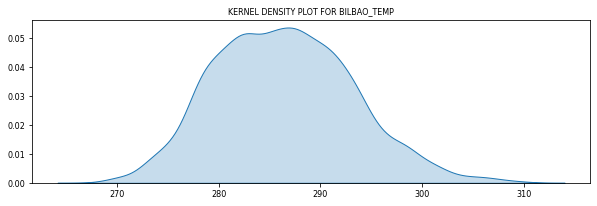

In [71]:
#Kernel density plot for Bilbao temperature
cd.plot_kde(df_train, x_axis = 'bilbao_temp',  plot_title = 'kernel density plot for bilbao_temp',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

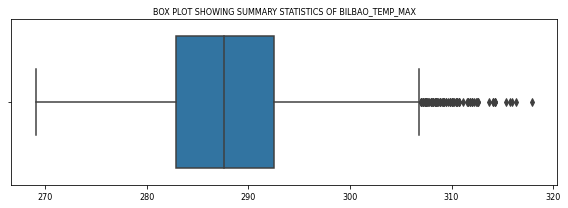

In [72]:
#Box plot for Bilbao maximum temperature
cd.plot_boxplot(df_train, x_axis = 'bilbao_temp_max', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_temp_max", tick_fontsize = 8)

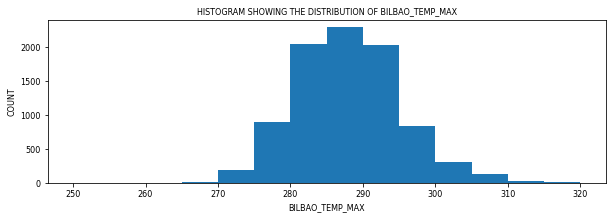

In [73]:
#Histogram for Bilbao maximum temperature
cd.plt_plot_hist(df_train, 'bilbao_temp_max', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_temp_max", x_label = 'bilbao_temp_max',  
                 bin_edge = 250, y_label ='count')

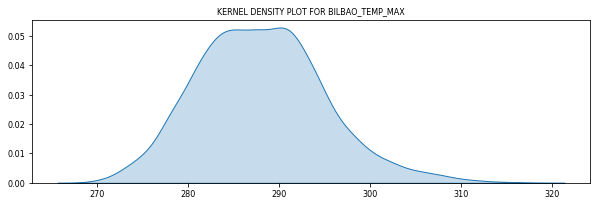

In [74]:
#Kernel density plot for Bilbao maximum temperature
cd.plot_kde(df_train, x_axis = 'bilbao_temp_max',  plot_title = 'kernel density plot for bilbao_temp_max',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

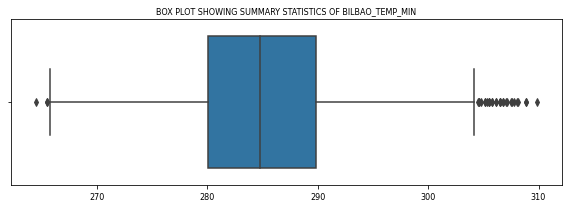

In [75]:
#Box plot for Bilbao minimum temperature
cd.plot_boxplot(df_train, x_axis = 'bilbao_temp_min', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_temp_min", tick_fontsize = 8)

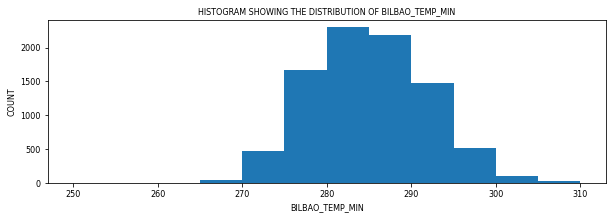

In [76]:
#Histogram for Bilbao minimum temperature
cd.plt_plot_hist(df_train, 'bilbao_temp_min', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_temp_min", x_label = 'bilbao_temp_min',  
                 bin_edge = 250, y_label ='count')

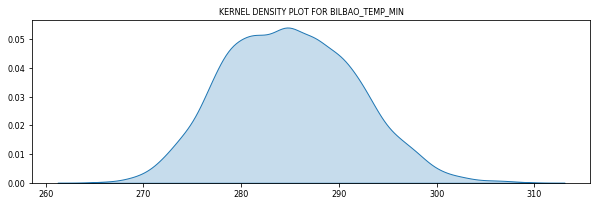

In [77]:
#Kernel density plot for Bilbao minimum temperature
cd.plot_kde(df_train, x_axis = 'bilbao_temp_min',  plot_title = 'kernel density plot for bilbao_temp_min',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

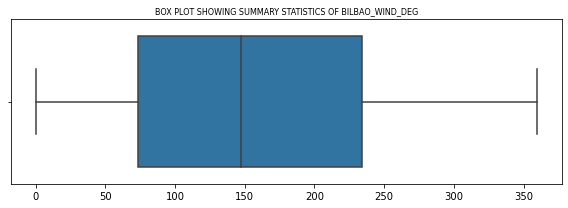

In [78]:
#Box plot for Bilbao wind degree
cd.plot_boxplot(df_train, x_axis = 'bilbao_wind_deg', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_wind_deg", tick_fontsize = 10)

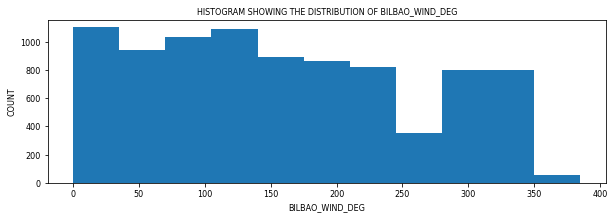

In [79]:
#Histogram for Bilbao wind degree
cd.plt_plot_hist(df_train, 'bilbao_wind_deg', bin_num = 35, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_wind_deg", x_label = 'bilbao_wind_deg',  
                 bin_edge = 0, y_label ='count')

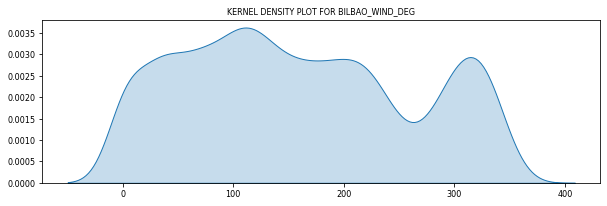

In [80]:
#Kernel density plot for Bilbao wind degree
cd.plot_kde(df_train, x_axis = 'bilbao_wind_deg',  plot_title = 'kernel density plot for bilbao_wind_deg',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

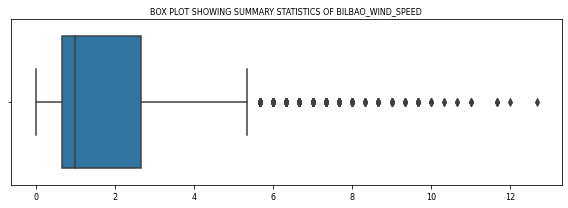

In [81]:
#Box plot for Bilbao wind speed
cd.plot_boxplot(df_train, x_axis = 'bilbao_wind_speed', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of bilbao_wind_speed", tick_fontsize = 8)

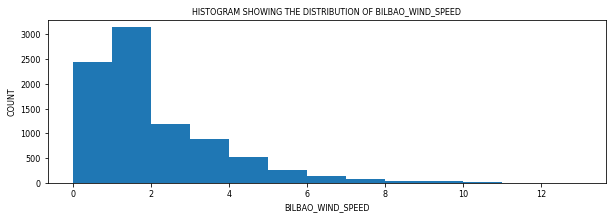

In [82]:
#Histogram for Bilbao wind speed
cd.plt_plot_hist(df_train, 'bilbao_wind_speed', bin_num = 1, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_wind_speed", x_label = 'bilbao_wind_speed',  
                 bin_edge = 0, y_label ='count')

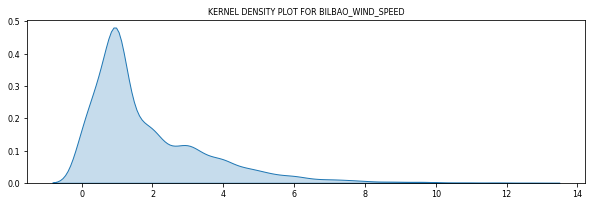

In [83]:
#Kernel density for Bilbao wind speed
cd.plot_kde(df_train, x_axis = 'bilbao_wind_speed',  plot_title = 'kernel density plot for bilbao_wind_speed',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

***Madrid***

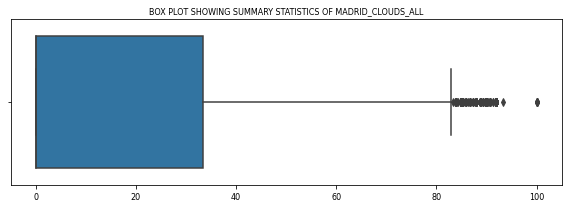

In [84]:
#Box plot for Madrid clouds
cd.plot_boxplot(df_train, x_axis = 'madrid_clouds_all', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_clouds_all", tick_fontsize = 8)

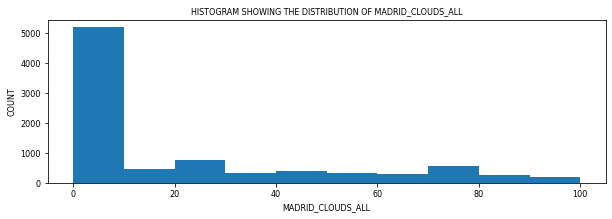

In [85]:
#Histogram for Madrid clouds
cd.plt_plot_hist(df_train, 'madrid_clouds_all', bin_num = 10, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_clouds_all", x_label = 'madrid_clouds_all',  
                 bin_edge = 0, y_label ='count')

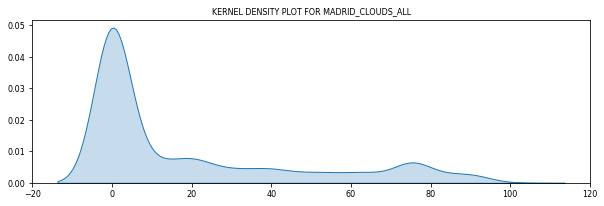

In [86]:
#Kernel density plot for Madrid clouds
cd.plot_kde(df_train, x_axis = 'madrid_clouds_all',  plot_title = 'kernel density plot for madrid_clouds_all',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

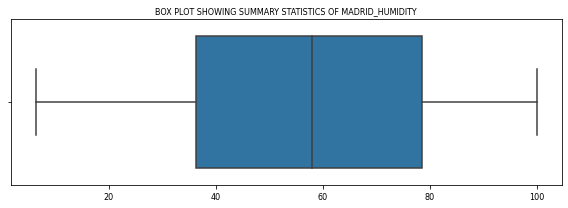

In [87]:
#Box plot for Madrid humidity
cd.plot_boxplot(df_train, x_axis = 'madrid_humidity', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_humidity", tick_fontsize = 8)

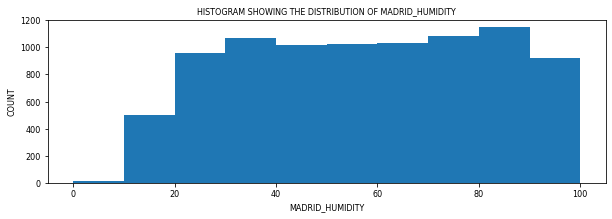

In [88]:
#Histogram for Madrid humidity
cd.plt_plot_hist(df_train, 'madrid_humidity', bin_num = 10, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_humidity", x_label = 'madrid_humidity',  
                 bin_edge = 0, y_label ='count')

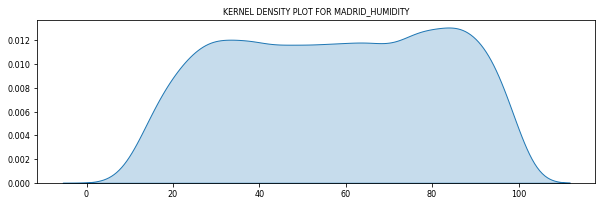

In [89]:
#Kernel density plot for Madrid humidity
cd.plot_kde(df_train, x_axis = 'madrid_humidity',  plot_title = 'kernel density plot for madrid_humidity',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

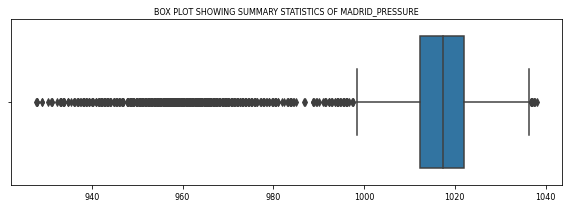

In [90]:
#Box plot for Madrid pressure
cd.plot_boxplot(df_train, x_axis = 'madrid_pressure', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_pressure", tick_fontsize = 8)

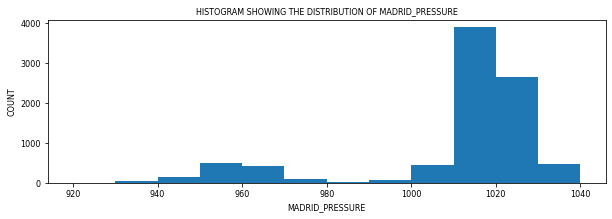

In [91]:
#Histogram for Madrid pressure
cd.plt_plot_hist(df_train, 'madrid_pressure', bin_num = 10, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_pressure", x_label = 'madrid_pressure',  
                 bin_edge = 920, y_label ='count')

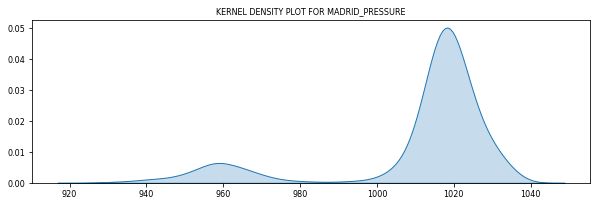

In [92]:
#Kernel density plot for Madrid pressure
cd.plot_kde(df_train, x_axis = 'madrid_pressure',  plot_title = 'kernel density plot for madrid_pressure',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

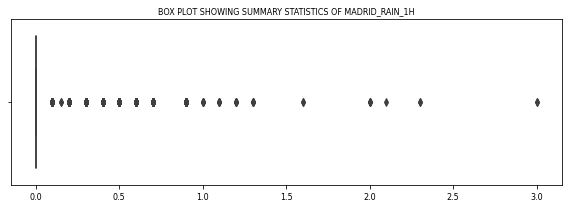

In [93]:
#Box plot for Madrid rain_1h
cd.plot_boxplot(df_train, x_axis = 'madrid_rain_1h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_rain_1h", tick_fontsize = 8)

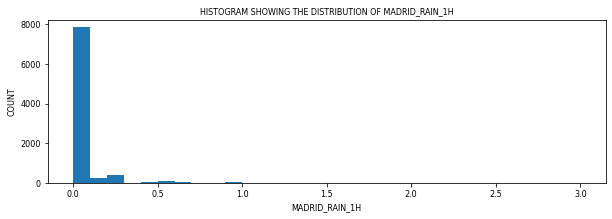

In [94]:
#Histogram for Madrid rain_1h
cd.plt_plot_hist(df_train, 'madrid_rain_1h', bin_num = 0.1, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_rain_1h", x_label = 'madrid_rain_1h',  
                 bin_edge = 0, y_label ='count')

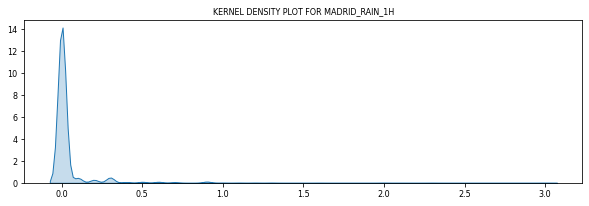

In [95]:
#Kernel density plot for Madrid rain_1h
cd.plot_kde(df_train, x_axis = 'madrid_rain_1h',  plot_title = 'kernel density plot for madrid_rain_1h',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

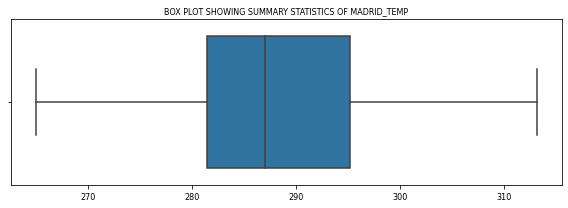

In [96]:
#Box plot for Madrid temperature
cd.plot_boxplot(df_train, x_axis = 'madrid_temp', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_temp", tick_fontsize = 8)

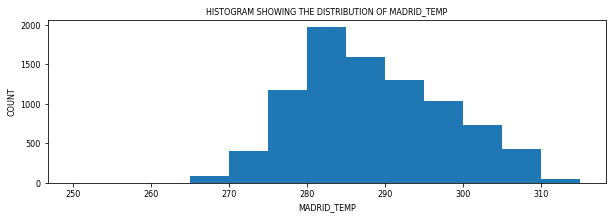

In [97]:
#Histogram for Madrid temperature
cd.plt_plot_hist(df_train, 'madrid_temp', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_temp", x_label = 'madrid_temp',  
                 bin_edge =250, y_label ='count')

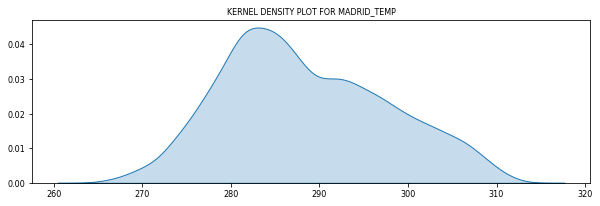

In [98]:
#Kernel density plot for Madrid temperature
cd.plot_kde(df_train, x_axis = 'madrid_temp',  plot_title = 'kernel density plot for madrid_temp',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

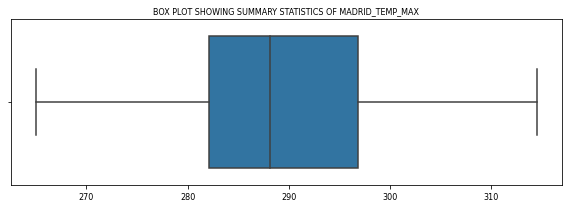

In [99]:
#Box plot for Madrid maximum temperature
cd.plot_boxplot(df_train, x_axis = 'madrid_temp_max', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_temp_max", tick_fontsize = 8)

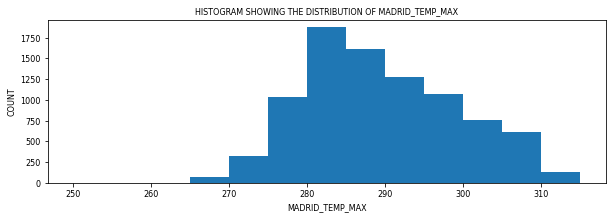

In [100]:
#Histogram for Madrid maximum temperature
cd.plt_plot_hist(df_train, 'madrid_temp_max', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_temp_max", x_label = 'madrid_temp_max',  
                 bin_edge = 250, y_label ='count')

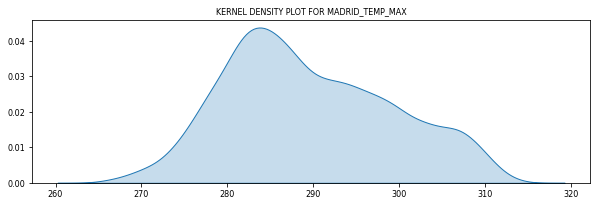

In [101]:
#Kernel density plot for Madrid maximum temperature
cd.plot_kde(df_train, x_axis = 'madrid_temp_max',  plot_title = 'kernel density plot for madrid_temp_max',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

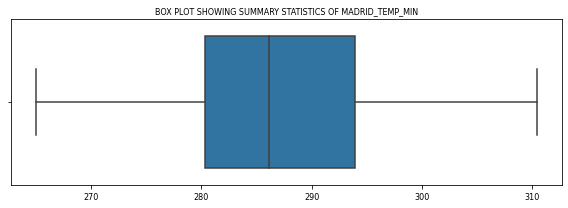

In [102]:
#Box plot for Madrid minimum temperature
cd.plot_boxplot(df_train, x_axis = 'madrid_temp_min', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_temp_min", tick_fontsize = 8)

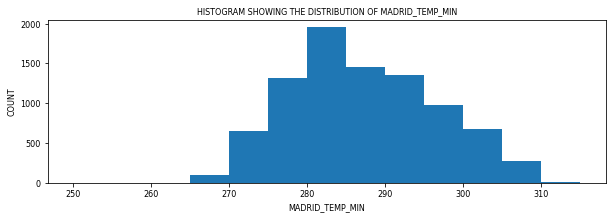

In [103]:
#Histogram for Madrid minimum temperature
cd.plt_plot_hist(df_train, 'madrid_temp_min', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_temp_min", x_label = 'madrid_temp_min',  
                 bin_edge = 250, y_label ='count')

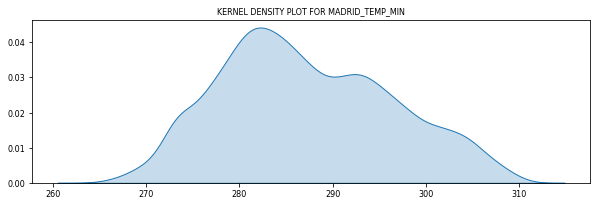

In [104]:
#Kernel density plot for Madrid minimum temperature
cd.plot_kde(df_train, x_axis = 'madrid_temp_min',  plot_title = 'kernel density plot for madrid_temp_min',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

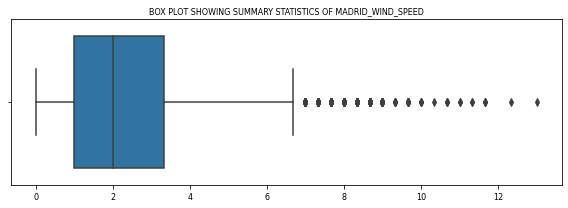

In [105]:
#Box plot for Madrid wind speed
cd.plot_boxplot(df_train, x_axis = 'madrid_wind_speed', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of madrid_wind_speed", tick_fontsize = 8)

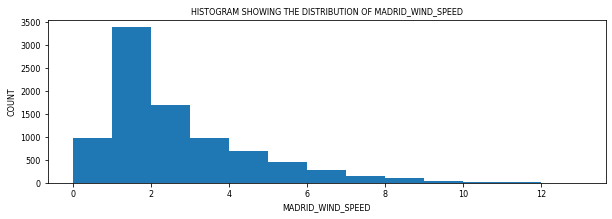

In [106]:
#Histogram for Madrid wind speed
cd.plt_plot_hist(df_train, 'madrid_wind_speed', bin_num = 1, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of madrid_wind_speed", x_label = 'madrid_wind_speed',  
                 bin_edge = 0, y_label ='count')

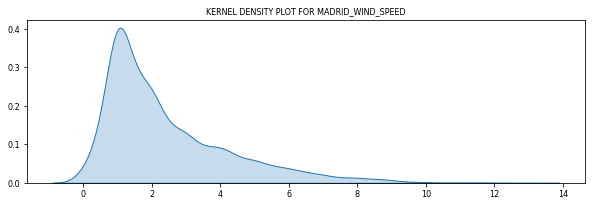

In [107]:
#Kernel density plot for Madrid wind speed
cd.plot_kde(df_train, x_axis = 'madrid_wind_speed',  plot_title = 'kernel density plot for madrid_wind_speed',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

***Seville***

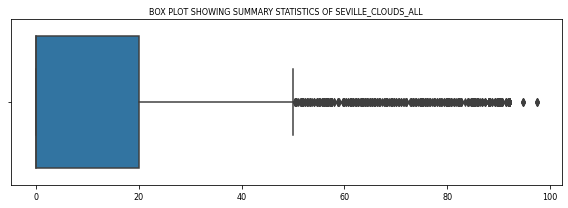

In [108]:
#Box plot for Seville clouds
cd.plot_boxplot(df_train, x_axis = 'seville_clouds_all', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_clouds_all", tick_fontsize = 8)

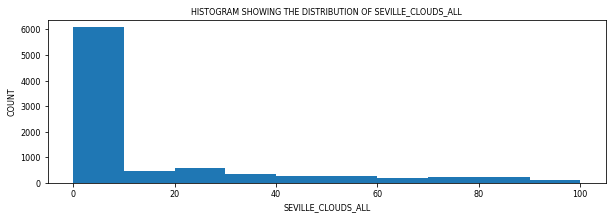

In [109]:
#Histogram for Seville clouds
cd.plt_plot_hist(df_train, 'seville_clouds_all', bin_num = 10, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_clouds_all", x_label = 'seville_clouds_all',  
                 bin_edge = 0, y_label ='count')

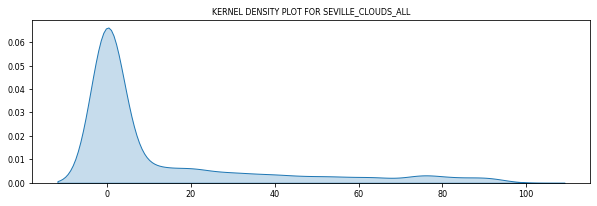

In [110]:
#Kernel density plot for Seville clouds
cd.plot_kde(df_train, x_axis = 'seville_clouds_all',  plot_title = 'kernel density plot for seville_clouds_all',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

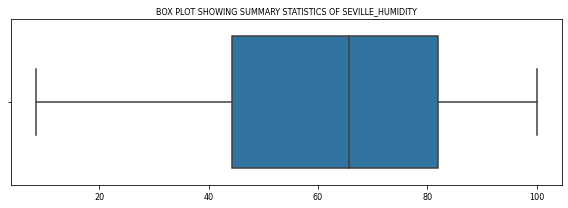

In [111]:
#Box plot for Seville humidity
cd.plot_boxplot(df_train, x_axis = 'seville_humidity', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_humidity", tick_fontsize = 8)

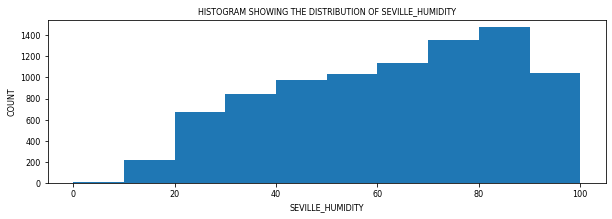

In [112]:
#Histogram for Seville humidity
cd.plt_plot_hist(df_train, 'seville_humidity', bin_num = 10, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_humidity", x_label = 'seville_humidity',  
                 bin_edge = 0, y_label ='count')

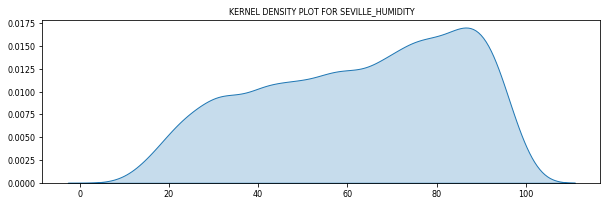

In [113]:
#Kernel density plot for Seville humidity
cd.plot_kde(df_train, x_axis = 'seville_humidity',  plot_title = 'kernel density plot for seville_humidity',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

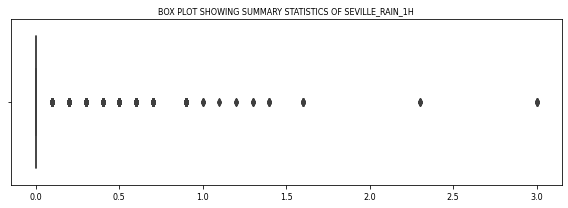

In [114]:
#Box plot for Seville rain_1h
cd.plot_boxplot(df_train, x_axis = 'seville_rain_1h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_rain_1h", tick_fontsize = 8)

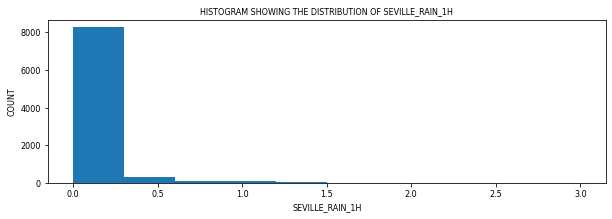

In [115]:
#Histogram for Seville rain_1h
cd.plt_plot_hist(df_train, 'seville_rain_1h', bin_num = 0.3, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_rain_1h", x_label = 'seville_rain_1h',  
                 bin_edge = 0, y_label ='count')

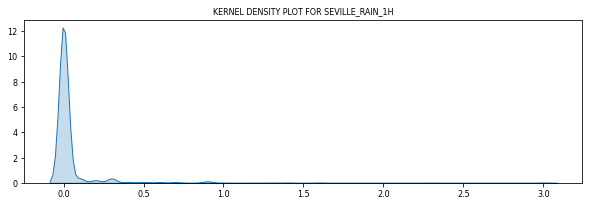

In [116]:
#Kernel density plot for Seville rain_1h
cd.plot_kde(df_train, x_axis = 'seville_rain_1h',  plot_title = 'kernel density plot for seville_rain_1h',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

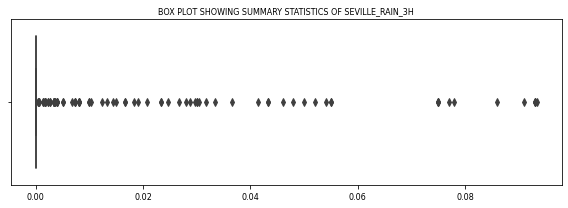

In [117]:
#Box plot for Seville rain_3h
cd.plot_boxplot(df_train, x_axis = 'seville_rain_3h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_rain_3h", tick_fontsize = 8)

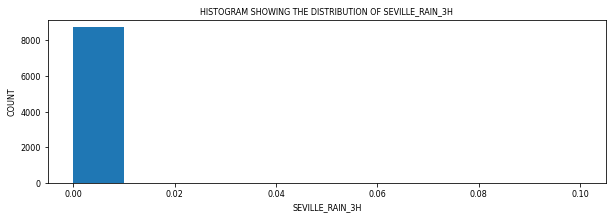

In [118]:
#Histogram for Seville rain_3h
cd.plt_plot_hist(df_train, 'seville_rain_3h', bin_num = 0.01, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_rain_3h", x_label = 'seville_rain_3h',  
                 bin_edge = 0, y_label ='count')

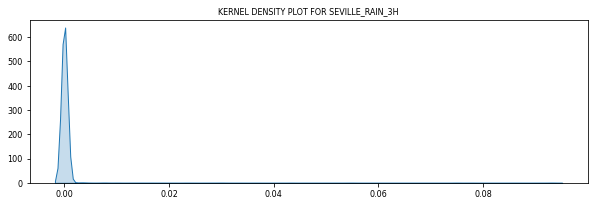

In [119]:
#Kernel density plot for Seville rain_3h
cd.plot_kde(df_train, x_axis = 'seville_rain_3h',  plot_title = 'kernel density plot for seville_rain_3h',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

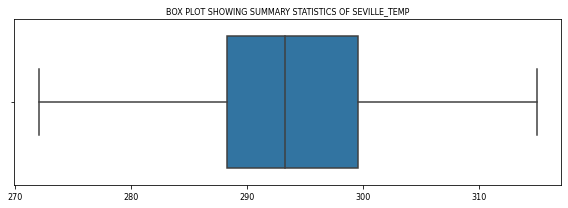

In [120]:
#Box plot for Seville temperature
cd.plot_boxplot(df_train, x_axis = 'seville_temp', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_temp", tick_fontsize = 8)

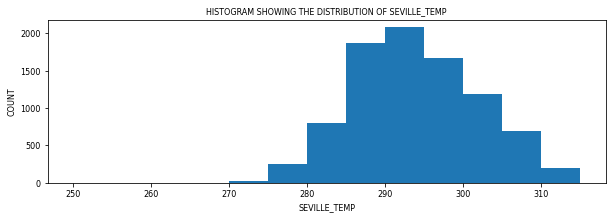

In [121]:
#Histogram plot for Seville temperature
cd.plt_plot_hist(df_train, 'seville_temp', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_temp", x_label = 'seville_temp',  
                 bin_edge = 250, y_label ='count')

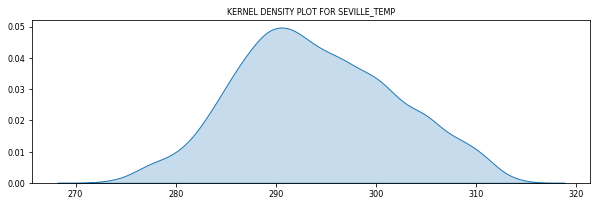

In [122]:
#Kernel density plot for Seville temperature
cd.plot_kde(df_train, x_axis = 'seville_temp',  plot_title = 'kernel density plot for seville_temp',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

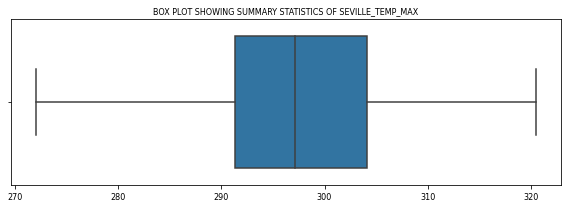

In [123]:
#Box plot for Seville maximum temperature
cd.plot_boxplot(df_train, x_axis = 'seville_temp_max', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_temp_max", tick_fontsize = 8)

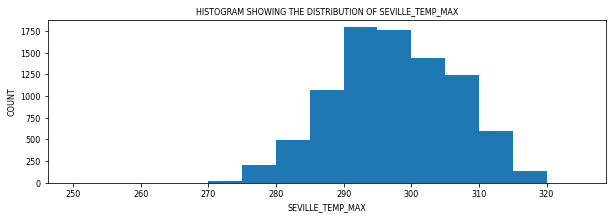

In [124]:
#Histogram for Seville maximum temperature
cd.plt_plot_hist(df_train, 'seville_temp_max', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_temp_max", x_label = 'seville_temp_max',  
                 bin_edge = 250, y_label ='count')

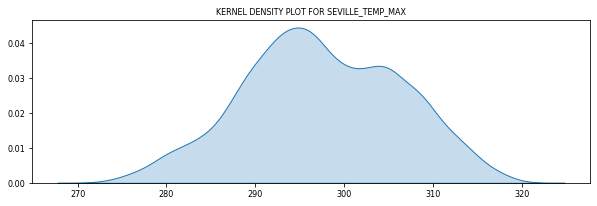

In [125]:
#Kernel density plot for Seville maximum temperature
cd.plot_kde(df_train, x_axis = 'seville_temp_max',  plot_title = 'kernel density plot for seville_temp_max',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

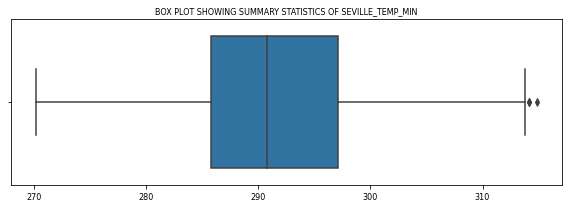

In [126]:
#Box plot for Seville minimum temperature
cd.plot_boxplot(df_train, x_axis = 'seville_temp_min', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_temp_min", tick_fontsize = 8)

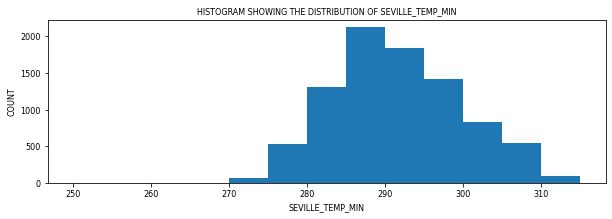

In [127]:
#Histogram for Seville minimum temperature
cd.plt_plot_hist(df_train, 'seville_temp_min', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_temp_min", x_label = 'seville_temp_min',  
                 bin_edge = 250, y_label ='count')

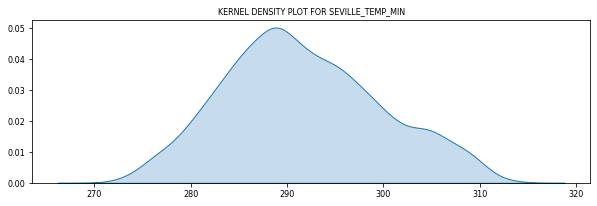

In [128]:
#Kernel density plot for Seville minimum temperature
cd.plot_kde(df_train, x_axis = 'seville_temp_min',  plot_title = 'kernel density plot for seville_temp_min',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

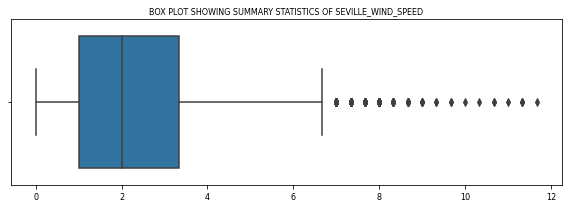

In [129]:
#Box plot for Seville wind speed
cd.plot_boxplot(df_train, x_axis = 'seville_wind_speed', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of seville_wind_speed", tick_fontsize = 8)

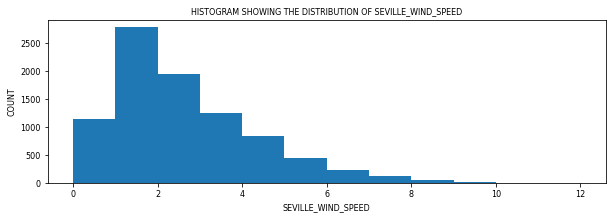

In [130]:
#Histogram for Seville wind speed
cd.plt_plot_hist(df_train, 'seville_wind_speed', bin_num = 1, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of seville_wind_speed", x_label = 'seville_wind_speed',  
                 bin_edge = 0, y_label ='count')

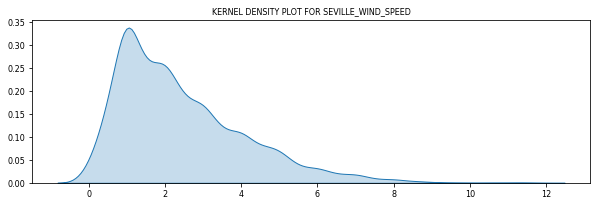

In [131]:
#Kernel density plot for Seville wind speed
cd.plot_kde(df_train, x_axis = 'seville_wind_speed',  plot_title = 'kernel density plot for seville_wind_speed',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

***Valencia***

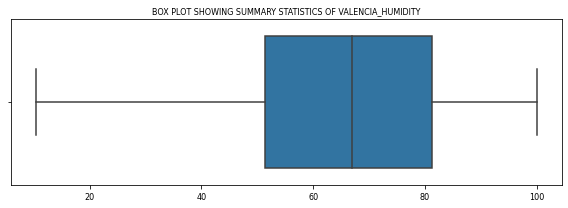

In [132]:
#Box plot for Valencia humidity
cd.plot_boxplot(df_train, x_axis = 'valencia_humidity', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of valencia_humidity", tick_fontsize = 8)

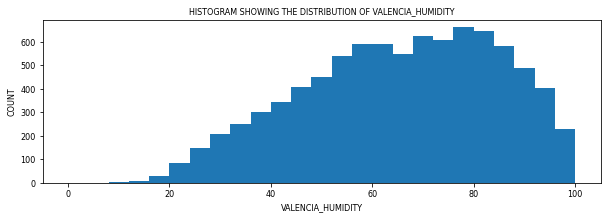

In [133]:
#Histogram for Valencia humidity
cd.plt_plot_hist(df_train, 'valencia_humidity', bin_num = 4, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of valencia_humidity", x_label = 'valencia_humidity',  
                 bin_edge = 0, y_label ='count')

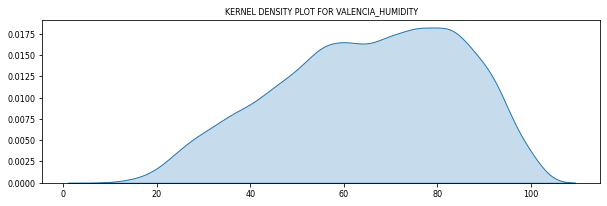

In [134]:
#Kernel density plot for Valencia humidity
cd.plot_kde(df_train, x_axis = 'valencia_humidity',  plot_title = 'kernel density plot for valencia_humidity',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

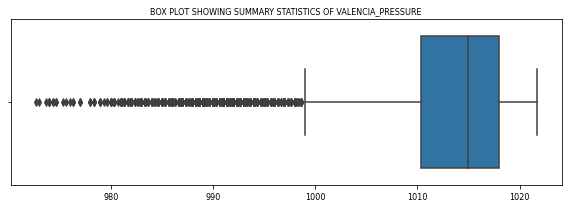

In [135]:
#Box plot for Valencia humidity
cd.plot_boxplot(df_train, x_axis = 'valencia_pressure', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of valencia_pressure", tick_fontsize = 8)

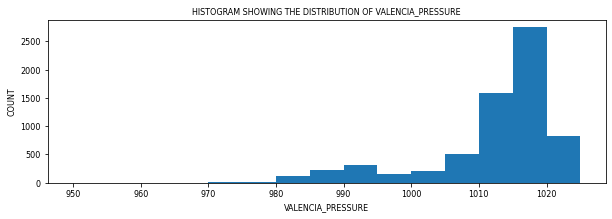

In [136]:
#Histogram for Valencia pressure
cd.plt_plot_hist(df_train, 'valencia_pressure', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of valencia_pressure", x_label = 'valencia_pressure',  
                 bin_edge = 950, y_label ='count')

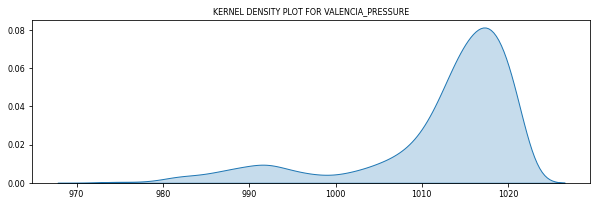

In [137]:
#Kernel density plot for Valencia pressure
cd.plot_kde(df_train, x_axis = 'valencia_pressure',  plot_title = 'kernel density plot for valencia_pressure',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

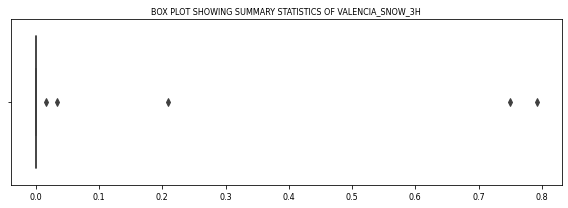

In [138]:
#Box plot for Valencia snow_3h
cd.plot_boxplot(df_train, x_axis = 'valencia_snow_3h', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of valencia_snow_3h", tick_fontsize = 8)

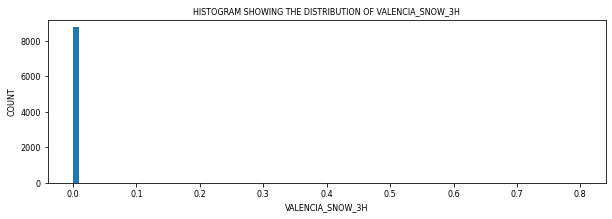

In [139]:
#Histogram for Valencia snow_3h
cd.plt_plot_hist(df_train, 'valencia_snow_3h', plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of valencia_snow_3h", x_label = 'valencia_snow_3h',  
                 bin_edge = 0, bin_num = 0.01, y_label ='count')

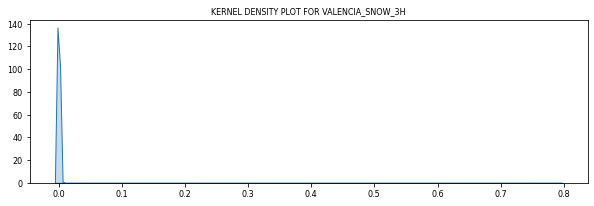

In [140]:
#Kernel density plot for Valencia snow_3h
cd.plot_kde(df_train, x_axis = 'valencia_snow_3h',  plot_title = 'kernel density plot for valencia_snow_3h',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

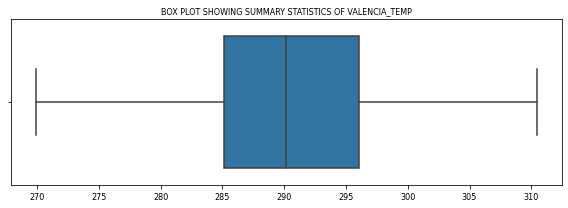

In [141]:
#Box plot for Valencia temperature
cd.plot_boxplot(df_train, x_axis = 'valencia_temp', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of valencia_temp", tick_fontsize = 8)

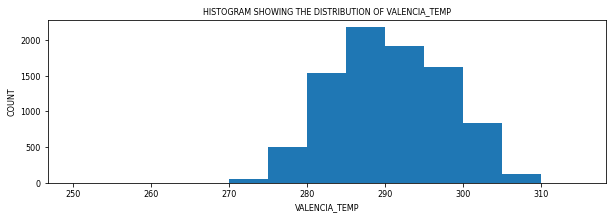

In [142]:
#Histogram for Valencia temperature
cd.plt_plot_hist(df_train, 'valencia_temp', bin_num = 5, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of valencia_temp", x_label = 'valencia_temp',  
                 bin_edge = 250, y_label ='count')

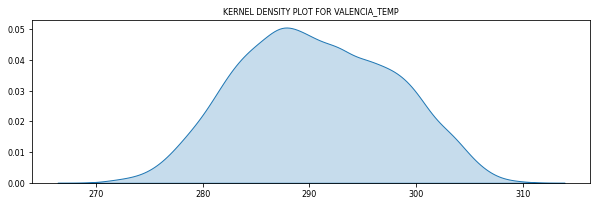

In [143]:
#Kernel density plot for Valencia temperature
cd.plot_kde(df_train, x_axis = 'valencia_temp',  plot_title = 'kernel density plot for valencia_temp',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

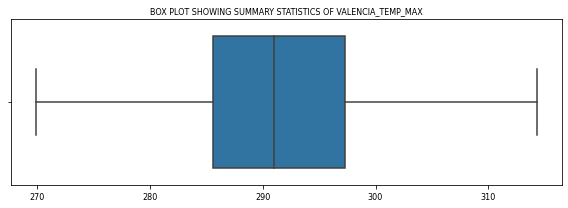

In [144]:
#Box plot for Valencia maximum temperature
cd.plot_boxplot(df_train, x_axis = 'valencia_temp_max', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of valencia_temp_max", tick_fontsize = 8)

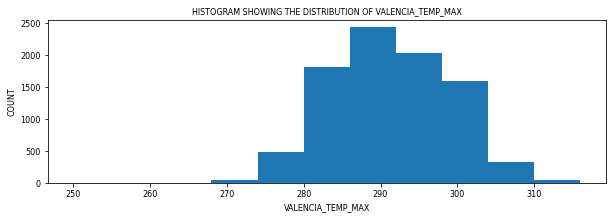

In [145]:
#Histogram for Valencia maximum temperature
cd.plt_plot_hist(df_train, 'valencia_temp_max', bin_num = 6, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of valencia_temp_max", x_label = 'valencia_temp_max',  
                 bin_edge = 250, y_label ='count')

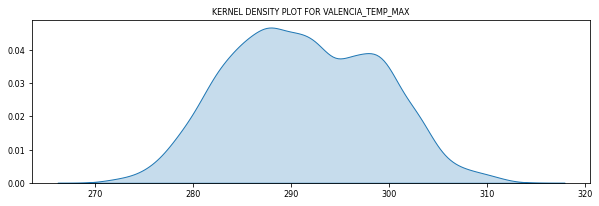

In [146]:
#Kernel density plot for Valencia maximum temperature
cd.plot_kde(df_train, x_axis = 'valencia_temp_max',  plot_title = 'kernel density plot for valencia_temp_max',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

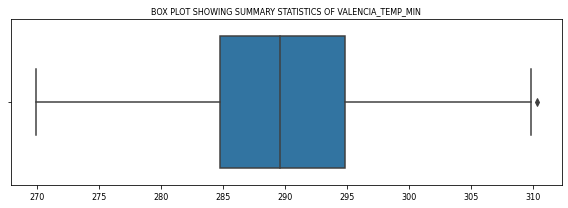

In [147]:
#Box plot for Valencia minimum temperature
cd.plot_boxplot(df_train, x_axis = 'valencia_temp_min', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of valencia_temp_min", tick_fontsize = 8)

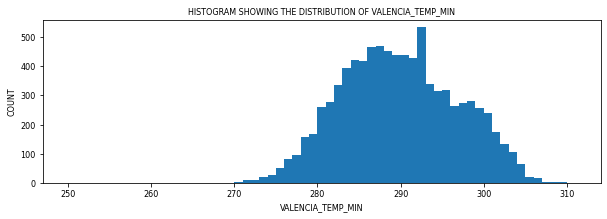

In [148]:
#Histogram for Valencia minimum temperature
cd.plt_plot_hist(df_train, 'valencia_temp_min', bin_num = 1, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of valencia_temp_min", x_label = 'valencia_temp_min',  
                 bin_edge = 250, y_label ='count')

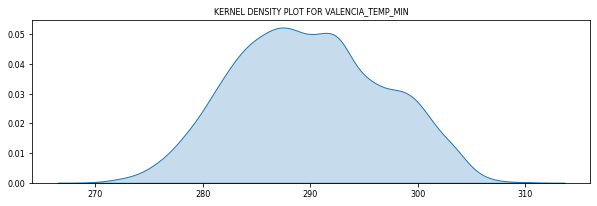

In [149]:
#Kernel density plot for Valencia minimum temperature
cd.plot_kde(df_train, x_axis = 'valencia_temp_min',  plot_title = 'kernel density plot for valencia_temp_min',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

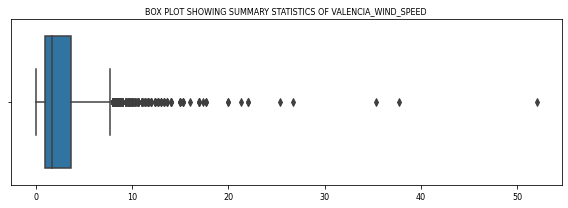

In [150]:
#Box plot for Valencia wind speed
cd.plot_boxplot(df_train, x_axis = 'valencia_wind_speed', univariate = True, plot_figsize =(8,3), plot_fontsize =8, 
                plot_title = "box plot showing summary statistics of valencia_wind_speed", tick_fontsize = 8)

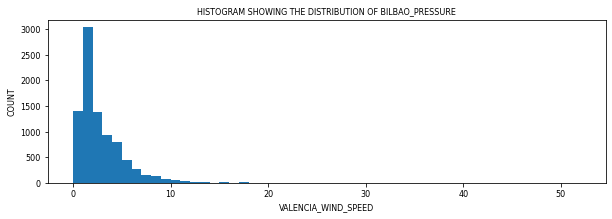

In [151]:
#Histogram for Valencia wind speed
cd.plt_plot_hist(df_train, 'valencia_wind_speed', bin_num = 1, plot_figsize =(10,3), plot_fontsize = 8, tick_fontsize = 8,
                plot_title ="histogram showing the distribution of bilbao_pressure", x_label = 'valencia_wind_speed',  
                 bin_edge = 0, y_label ='count')

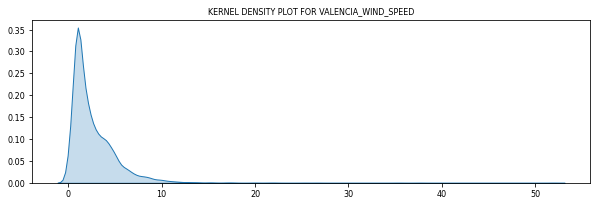

In [152]:
#Kernel density plot for Valencia wind speed
cd.plot_kde(df_train, x_axis = 'valencia_wind_speed',  plot_title = 'kernel density plot for valencia_wind_speed',
         should_fill = True, plot_fontsize = 8, tick_fontsize = 8, plot_figsize =(10,3))

In [153]:
seville_order = df_train['seville_pressure'].value_counts().index

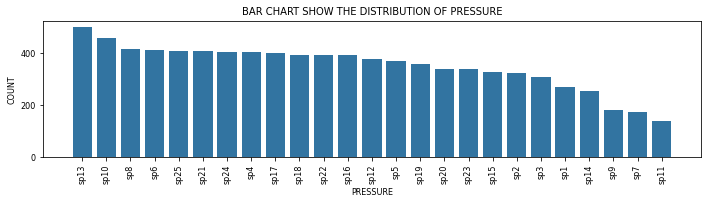

In [154]:
#Bar chart for Valencia pressure
cd.plot_count(df_train, x_axis = 'seville_pressure', x_label = 'pressure', y_label='count', plot_figsize =(10,3),
             plot_title = 'bar chart show the distribution of pressure', plot_fontsize = 8, plot_color = cd.dark_blue,
             tick_rotation = 90, plot_title_fontsize = 10, plot_order = seville_order, tick_fontsize = 8)

In [155]:
valencia_order = df_train['valencia_wind_deg'].value_counts().index

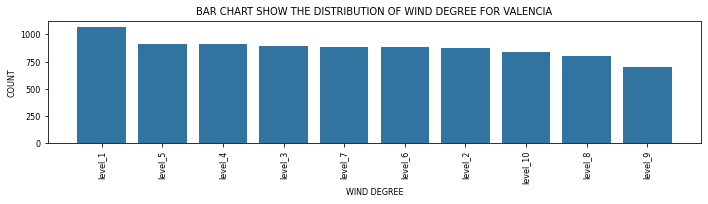

In [156]:
#Bar chat for Valencia wind degree
cd.plot_count(df_train, x_axis = 'valencia_wind_deg', x_label = 'wind degree', y_label='count', plot_figsize =(10,3),
             plot_title = 'bar chart show the distribution of wind degree for valencia', plot_fontsize = 8, 
              plot_color = cd.dark_blue, tick_rotation = 90, plot_title_fontsize = 10, plot_order = valencia_order, 
              tick_fontsize = 8)

<a id="three"></a>
## 4. Data Cleaning Operations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data Cleaning and transformation ⚡ |
| :--------------------------- |
| In this section, you are required to perform cleaning of the variables in the DataFrame. |

---


**Removing outliers**

In the cells below, a function was derived to look for outliers within the weather features from a variable "columns_with_outliers" that holds a list of columns. Outliers can be meaningless aberrations caused by measurement and recording errors. In such case, they can cause problems or lead to poor analysis of the effects of weather features on loadshort_fall, so it's important to observe outliers and remove where necessary.

In [157]:
columns_with_outliers =['madrid_wind_speed', 'valencia_wind_speed', 'seville_humidity', 'madrid_humidity', 
                'bilbao_clouds_all', 'bilbao_wind_speed', 'seville_clouds_all', 'barcelona_wind_speed', 'madrid_clouds_all',
                'seville_wind_speed', 'seville_temp_max', 'valencia_temp_max', 
                'valencia_temp', 'seville_temp', 'valencia_humidity', 'valencia_temp_min', 'barcelona_temp_max', 
                'madrid_temp_max', 'barcelona_temp', 'bilbao_temp_min', 'bilbao_temp', 'barcelona_temp_min', 
                'bilbao_temp_max', 'seville_temp_min', 'madrid_temp', 'madrid_temp_min', 'barcelona_wind_deg', 
                'barcelona_pressure', 'bilbao_pressure', 'bilbao_wind_deg', 'madrid_pressure', 'valencia_pressure',]

In [158]:
for columns in columns_with_outliers:
    cd.outliers(df_train, columns)

**Dropping columns**

'Unnamed: 0' columns in the following drop() command was dropped from train and test datasets because it serves no purpose towards pragmatic and exploratory data analysis, data visualization and model building.


In [159]:
df_test.drop(['unnamed: 0'], axis = 1, inplace = True)
df_train.drop(['unnamed: 0'], axis = 1, inplace = True)

**Handling nulls**

It was discovered in both train and test dataset that the existence of null values does not make more than 50% of the data in the valencia_pressure. Hence, it was not necessary to drop the entire column. The nulls were replaced with the mean of the entire column to maintain data quality.

In [160]:
#fill null values for valencia pressure in the train dataset with mean
df_train['valencia_pressure'].fillna(df_train['valencia_pressure'].mean(), inplace = True)
#fill null values for valencia pressure in the test dataset with mean
df_test['valencia_pressure'].fillna(df_test['valencia_pressure'].mean(), inplace = True)

**Transforming data**

In the following cell, 'valencia_wind_deg' and 'seville_pressure' for train and test datasets are being transformed to make it better-organized and easy to use. Properly formatted and validated data improves data quality and protects applications from potential landmines such as null values, unexpected duplicates, incorrect indexing, and incompatible formats.

Transforming 'valencia_wind_deg' and 'seville_pressure' from categorical to intergers using the command: str.extract('(\d+)').astype().

In [161]:
"""First we will start by Transforming the Valencia_wind_deg and Seville_pressure columns to numeric.
This is done to ensure uniformity (numeric values) in our model"""

df_train['valencia_wind_deg'] = df_train['valencia_wind_deg'].str.extract('(\d+)').astype('int64')
df_train['seville_pressure'] = df_train['seville_pressure'].str.extract('(\d+)').astype('int64')
df_test['valencia_wind_deg'] = df_test['valencia_wind_deg'].str.extract('(\d+)').astype('int64')
df_test['seville_pressure'] = df_test['seville_pressure'].str.extract('(\d+)').astype('int64')

Transforming 'time' columns in the train and test datasets from objects and extracting year, month, week of year, day of year, day, day of week, hour and hour

In [162]:
df_train['year']  = df_train['time'].astype('datetime64').dt.year
df_train['month_of_year']  = df_train['time'].astype('datetime64').dt.month
df_train['week_of_year'] = df_train['time'].astype('datetime64').dt.weekofyear
df_train['day_of_year']  = df_train['time'].astype('datetime64').dt.dayofyear
df_train['day_of_month']  = df_train['time'].astype('datetime64').dt.day
df_train['day_of_week'] = df_train['time'].astype('datetime64').dt.dayofweek
df_train['hour_of_week'] = ((df_train['time'].astype('datetime64').dt.dayofweek) * 24 + 24) - (24 - df_train['time'].astype('datetime64').dt.hour)
df_train['hour_of_day']  = df_train['time'].astype('datetime64').dt.hour

In [163]:
df_test['year']  = df_test['time'].astype('datetime64').dt.year
df_test['month_of_year']  = df_test['time'].astype('datetime64').dt.month
df_test['week_of_year'] = df_test['time'].astype('datetime64').dt.weekofyear
df_test['day_of_year']  = df_test['time'].astype('datetime64').dt.dayofyear
df_test['day_of_month']  = df_test['time'].astype('datetime64').dt.day
df_test['day_of_week'] = df_test['time'].astype('datetime64').dt.dayofweek
df_test['hour_of_week'] = ((df_test['time'].astype('datetime64').dt.dayofweek) * 24 + 24) - (24 - df_test['time'].astype('datetime64').dt.hour)
df_test['hour_of_day']  = df_test['time'].astype('datetime64').dt.hour

**Checking correlation**

In the following cells, correlation was evaluated by defining a function "identify_correlated", sing correlation matrix, boolean mask, and lambda function to identify columns that are highly correlation and then drop them because they will contribute very little to the model. Then correlation between weather features was displayed in a tabular format using ".corr()"

In [164]:
def identify_correlated(df, threshold):
    """
    A function to identify highly correlated features.
    """
    # Compute correlation matrix with absolute values
    matrix = df.corr().abs()
    
    # Create a boolean mask
    mask = cd.np.triu(cd.np.ones_like(matrix, dtype=bool))
    
    # Subset the matrix
    reduced_matrix = matrix.mask(mask)
    
    # Find cols that meet the threshold
    columns_to_drop = [c for c in reduced_matrix.columns if \
              any(reduced_matrix[c] > threshold)]
    
    return columns_to_drop

In [165]:
df_train.corr()

,madrid_wind_speed,valencia_wind_deg,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,seville_clouds_all,bilbao_wind_deg,...,madrid_temp_min,load_shortfall_3h,year,month_of_year,week_of_year,day_of_year,day_of_month,day_of_week,hour_of_week,hour_of_day
madrid_wind_speed,1.000000,0.113476,0.262217,0.521787,-0.127461,-0.151845,0.247805,0.361525,0.193932,0.274726,...,0.114033,-0.149546,-0.039069,-0.236606,-0.234821,-0.238013,-0.027110,3.038337e-04,0.027565,1.922489e-01
valencia_wind_deg,0.113476,1.000000,0.199288,0.301327,0.240007,0.253549,0.158266,0.064016,0.087338,0.157252,...,-0.316603,-0.188674,-0.057513,-0.140195,-0.136023,-0.139043,-0.010627,1.306817e-02,-0.006694,-1.384151e-01
bilbao_rain_1h,0.262217,0.199288,1.000000,0.222019,0.069878,0.106765,0.370733,0.084546,0.080009,0.279350,...,-0.116431,-0.152510,-0.200747,-0.188274,-0.179233,-0.181232,0.072752,3.232531e-02,0.039731,5.452669e-02
valencia_wind_speed,0.521787,0.301327,0.222019,1.000000,-0.121893,-0.056376,0.216604,0.416334,0.153942,0.259749,...,0.004916,-0.135941,0.008358,-0.235688,-0.231268,-0.234762,-0.009696,1.561068e-02,0.049515,2.401775e-01
seville_humidity,-0.127461,0.240007,0.069878,-0.121893,1.000000,0.799831,0.061680,-0.111722,0.408963,-0.087246,...,-0.688664,-0.167290,-0.045730,-0.111622,-0.094444,-0.106347,0.032979,8.265003e-03,-0.052089,-4.249821e-01
madrid_humidity,-0.151845,0.253549,0.106765,-0.056376,0.799831,1.000000,0.041878,-0.032699,0.388533,-0.069570,...,-0.759633,-0.150536,-0.084456,-0.076567,-0.054840,-0.070122,0.047372,4.108225e-03,-0.039595,-3.078718e-01
bilbao_clouds_all,0.247805,0.158266,0.370733,0.216604,0.061680,0.041878,1.000000,0.027721,0.047732,0.280154,...,-0.046189,-0.127293,-0.031658,-0.117452,-0.122268,-0.114651,0.025688,3.834215e-02,0.034591,-2.371425e-02
bilbao_wind_speed,0.361525,0.064016,0.084546,0.416334,-0.111722,-0.032699,0.027721,1.000000,0.129993,0.432718,...,0.039912,-0.076107,0.083577,-0.084085,-0.074846,-0.084258,-0.010175,-1.067549e-02,0.020478,2.189088e-01
seville_clouds_all,0.193932,0.087338,0.080009,0.153942,0.408963,0.388533,0.047732,0.129993,1.000000,0.055862,...,-0.227504,-0.088292,-0.089973,-0.172497,-0.151293,-0.169816,0.012518,1.138338e-02,0.009226,-1.439805e-02
bilbao_wind_deg,0.274726,0.157252,0.279350,0.259749,-0.087246,-0.069570,0.280154,0.432718,0.055862,1.000000,...,0.048397,-0.120800,-0.104647,-0.174941,-0.168192,-0.171474,0.034253,7.095492e-03,0.022689,1.104574e-01


In [166]:
df_test.corr()

,madrid_wind_speed,valencia_wind_deg,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,seville_clouds_all,bilbao_wind_deg,...,madrid_temp,madrid_temp_min,year,month_of_year,week_of_year,day_of_year,day_of_month,day_of_week,hour_of_week,hour_of_day
madrid_wind_speed,1.000000,0.079264,0.253975,0.577509,-0.107176,-0.055267,0.164097,0.404369,0.166845,0.277087,...,-0.023591,-0.046734,NaN,-2.305676e-01,-2.284176e-01,-2.364170e-01,-6.616541e-02,1.899198e-02,0.046282,1.941791e-01
valencia_wind_deg,0.079264,1.000000,0.158646,0.156215,0.371675,0.377869,0.100203,0.004057,0.059595,-0.036801,...,-0.450454,-0.436631,NaN,-1.463948e-02,-2.557163e-02,-1.996988e-02,-7.418908e-02,-3.321531e-02,-0.072965,-2.832345e-01
bilbao_rain_1h,0.253975,0.158646,1.000000,0.155717,0.103573,0.149643,0.414151,0.118086,0.080647,0.183078,...,-0.218465,-0.217309,NaN,-1.693120e-01,-1.669430e-01,-1.710743e-01,-3.584892e-02,-1.259134e-03,-0.008657,-5.236210e-02
valencia_wind_speed,0.577509,0.156215,0.155717,1.000000,-0.214738,-0.100565,0.126358,0.423967,0.080878,0.281658,...,-0.006542,-0.033857,NaN,-2.272507e-01,-2.259691e-01,-2.306067e-01,-4.419779e-02,-5.968682e-03,0.029279,2.486332e-01
seville_humidity,-0.107176,0.371675,0.103573,-0.214738,1.000000,0.771534,0.033669,-0.172222,0.388829,-0.233416,...,-0.658135,-0.630085,NaN,-1.194557e-02,-1.277217e-02,-1.120529e-02,-7.208317e-04,1.570495e-02,-0.050207,-4.646130e-01
madrid_humidity,-0.055267,0.377869,0.149643,-0.100565,0.771534,1.000000,0.005968,-0.043188,0.327895,-0.169288,...,-0.777081,-0.756214,NaN,-2.668453e-02,-3.037708e-02,-3.156577e-02,-7.579193e-02,2.583130e-02,-0.021912,-3.355185e-01
bilbao_clouds_all,0.164097,0.100203,0.414151,0.126358,0.033669,0.005968,1.000000,0.001085,0.010232,0.227288,...,-0.104385,-0.108140,NaN,-1.965651e-01,-1.894112e-01,-1.923764e-01,3.723729e-02,-1.965633e-02,-0.021889,-1.717741e-02
bilbao_wind_speed,0.404369,0.004057,0.118086,0.423967,-0.172222,-0.043188,0.001085,1.000000,0.138443,0.519614,...,-0.004439,-0.030676,NaN,-1.294374e-01,-1.304968e-01,-1.373624e-01,-9.554894e-02,-2.750299e-02,0.006454,2.379800e-01
seville_clouds_all,0.166845,0.059595,0.080647,0.080878,0.388829,0.327895,0.010232,0.138443,1.000000,0.007418,...,-0.206495,-0.213871,NaN,-8.264594e-02,-8.471782e-02,-8.964610e-02,-8.578718e-02,4.391343e-02,0.040834,-1.863511e-02
bilbao_wind_deg,0.277087,-0.036801,0.183078,0.281658,-0.233416,-0.169288,0.227288,0.519614,0.007418,1.000000,...,0.130515,0.112450,NaN,-1.354529e-01,-1.271273e-01,-1.361614e-01,-5.895079e-03,-5.870829e-03,0.029437,2.490645e-01


**Visualizing correlation**

Here correlation is visualized to test the relationships between weather features in the dataset. A heatmap was plotted to check the whole scope of weather features in dataset in relation to one another as a way of projecting underlying relationships that may be present.

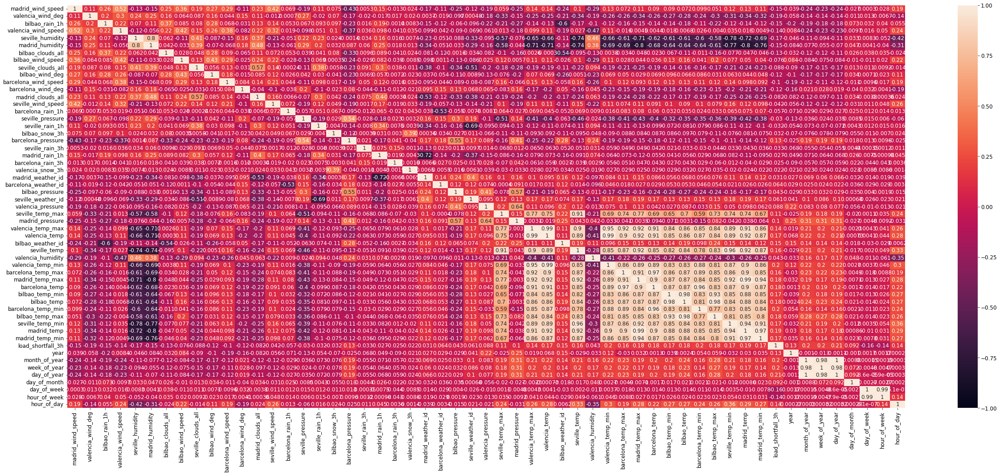

In [167]:
# Visualizing the correlation
cd.plt.figure(figsize=[35,15])
cd.sb.heatmap(df_train.corr(), vmin=-1, vmax=1 ,annot=True);

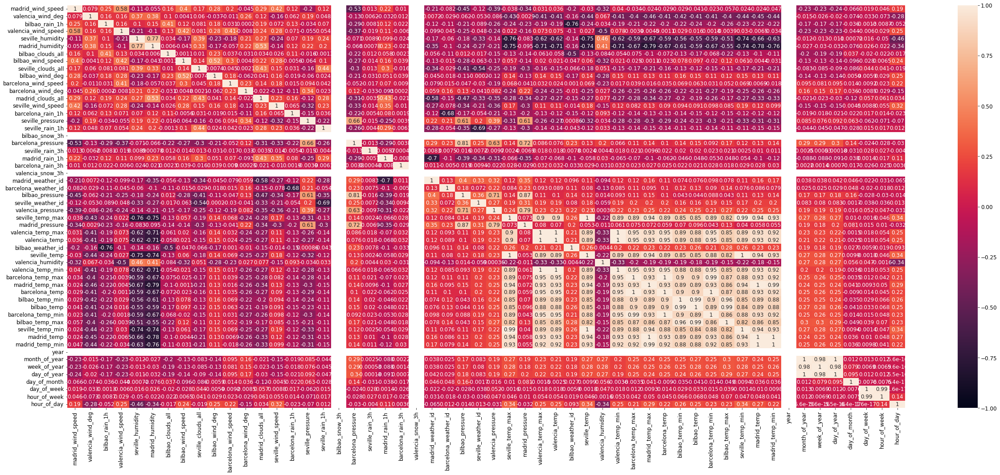

In [168]:
# Visualizing the correlation
cd.plt.figure(figsize=[35,15])
cd.sb.heatmap(df_test.corr(), vmin=-1, vmax=1 ,annot=True);

Listing columns that are highly correlated by setting the condition for correlation (df, 0.7), which means seventy percent of correlation:

In [169]:
identify_correlated(df_train, 0.7)

['seville_humidity',
 'madrid_humidity',
 'madrid_rain_1h',
 'seville_temp_max',
 'valencia_temp_max',
 'valencia_temp',
 'seville_temp',
 'valencia_temp_min',
 'barcelona_temp_max',
 'madrid_temp_max',
 'barcelona_temp',
 'bilbao_temp_min',
 'bilbao_temp',
 'barcelona_temp_min',
 'bilbao_temp_max',
 'seville_temp_min',
 'madrid_temp',
 'month_of_year',
 'week_of_year',
 'day_of_week']

In [170]:
identify_correlated(df_test, 0.7)

['bilbao_rain_1h',
 'seville_humidity',
 'madrid_humidity',
 'barcelona_pressure',
 'madrid_rain_1h',
 'bilbao_pressure',
 'valencia_pressure',
 'seville_temp_max',
 'valencia_temp_max',
 'valencia_temp',
 'seville_temp',
 'valencia_temp_min',
 'barcelona_temp_max',
 'madrid_temp_max',
 'barcelona_temp',
 'bilbao_temp_min',
 'bilbao_temp',
 'barcelona_temp_min',
 'bilbao_temp_max',
 'seville_temp_min',
 'madrid_temp',
 'month_of_year',
 'week_of_year',
 'day_of_week']

<a id="four"></a>
## 4. Data Engineering
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Data engineering ⚡ |
| :--------------------------- |
| In this section you are required to: clean the dataset, and possibly create new features - as identified in the EDA phase. |

---

The following command shows all the column names of the features stored in the train dataset.

In [171]:
df_train.columns

Index(['time', 'madrid_wind_speed', 'valencia_wind_deg', 'bilbao_rain_1h',
       'valencia_wind_speed', 'seville_humidity', 'madrid_humidity',
       'bilbao_clouds_all', 'bilbao_wind_speed', 'seville_clouds_all',
       'bilbao_wind_deg', 'barcelona_wind_speed', 'barcelona_wind_deg',
       'madrid_clouds_all', 'seville_wind_speed', 'barcelona_rain_1h',
       'seville_pressure', 'seville_rain_1h', 'bilbao_snow_3h',
       'barcelona_pressure', 'seville_rain_3h', 'madrid_rain_1h',
       'barcelona_rain_3h', 'valencia_snow_3h', 'madrid_weather_id',
       'barcelona_weather_id', 'bilbao_pressure', 'seville_weather_id',
       'valencia_pressure', 'seville_temp_max', 'madrid_pressure',
       'valencia_temp_max', 'valencia_temp', 'bilbao_weather_id',
       'seville_temp', 'valencia_humidity', 'valencia_temp_min',
       'barcelona_temp_max', 'madrid_temp_max', 'barcelona_temp',
       'bilbao_temp_min', 'bilbao_temp', 'barcelona_temp_min',
       'bilbao_temp_max', 'seville_temp_min'

#### A look into the correlation of the train dataset to detect multicolinearity

Multicollinearity occurs when there is high intercorrelations among two or more independent variables in a multiple regression model. multicollinearity can be a problem because it undermines the statistical significance of an independent variables.

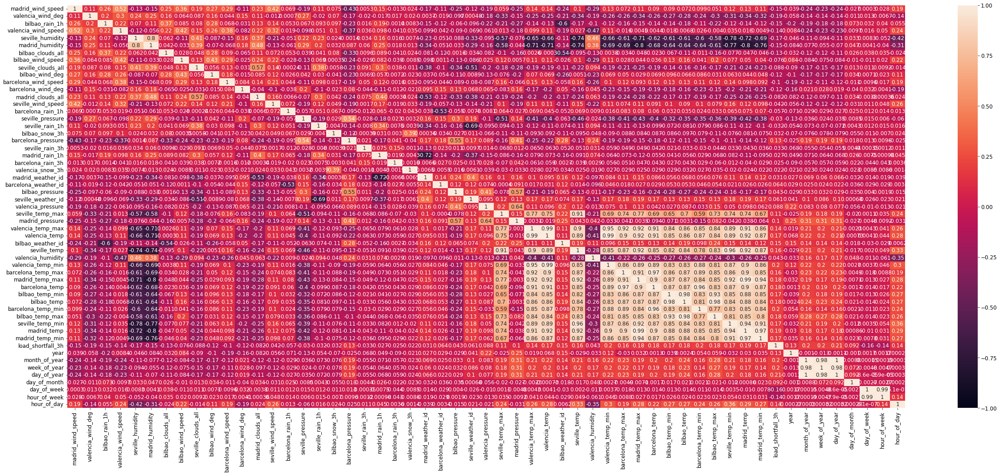

In [172]:
# Visualizing the correlation
cd.plt.figure(figsize=[35,15])
cd.sb.heatmap(df_train.corr(), vmin=-1, vmax=1 ,annot=True);

>There is presence of high correlations between the various columns in the train dataset and also possible outliers.

>We would have to drop these columns to improve the performance of our model and reduce any possibility of overfitting in our model

#### A look into the correlation of the train dataset to detect multicolinearity

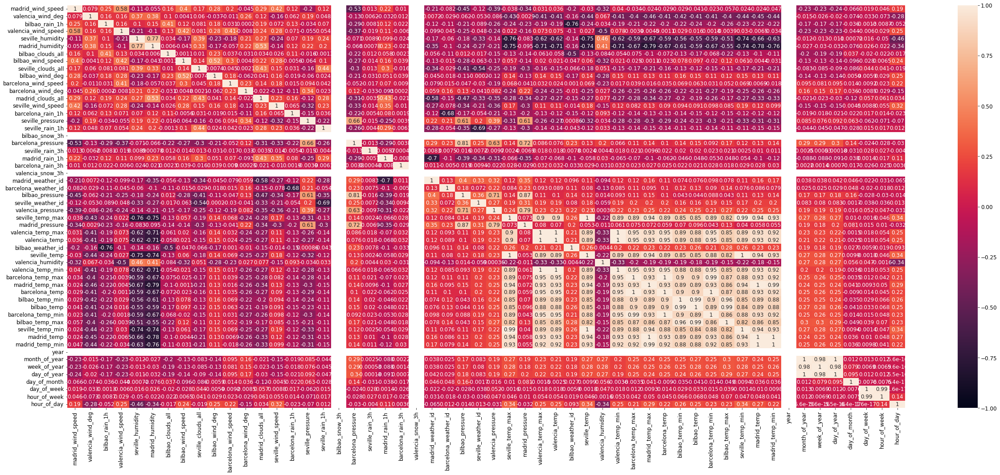

In [173]:
# Visualizing the correlation
cd.plt.figure(figsize=[35,15])
cd.sb.heatmap(df_test.corr(), vmin=-1, vmax=1 ,annot=True);

>There is presence of high correlations between the various columns in the test dataset and also possible outliers.

>We would have to drop these columns to improve the performance of our model and reduce any possibility of overfitting in our model

#### Here we identify the features with the lowest scores

In the following cell, weather features that are least important based on the score value determined by the the commands in the cell.

In [174]:
x1 = df_train.drop(columns = ['time','load_shortfall_3h',])
y1 = df_train['load_shortfall_3h'].astype('int')
top_features = SelectKBest(score_func=chi2, k=10)
fit = top_features.fit(x1,y1)
dfscores = cd.pd.DataFrame(fit.scores_)
dfcolumns = cd.pd.DataFrame(x1.columns)
featureScores = cd.pd.concat([dfcolumns, dfscores], axis=1)
featureScores.columns = ['Features', 'Score']
new_X = featureScores.sort_values('Score',ascending=False).head(67)
new_X.tail(10) #To get the least important feature based on their scores

,Features,Score
39,bilbao_temp_min,1095.669895
38,barcelona_temp,1023.804735
41,barcelona_temp_min,903.196295
29,madrid_pressure,624.590423
25,bilbao_pressure,574.772994
19,seville_rain_3h,383.079442
18,barcelona_pressure,329.572137
21,barcelona_rain_3h,247.853993
27,valencia_pressure,245.903478
46,year,2.314342


#### Here we Identified the highly correlated columns in the test dataset

In [175]:
identify_correlated(df_test, 0.7)

['bilbao_rain_1h',
 'seville_humidity',
 'madrid_humidity',
 'barcelona_pressure',
 'madrid_rain_1h',
 'bilbao_pressure',
 'valencia_pressure',
 'seville_temp_max',
 'valencia_temp_max',
 'valencia_temp',
 'seville_temp',
 'valencia_temp_min',
 'barcelona_temp_max',
 'madrid_temp_max',
 'barcelona_temp',
 'bilbao_temp_min',
 'bilbao_temp',
 'barcelona_temp_min',
 'bilbao_temp_max',
 'seville_temp_min',
 'madrid_temp',
 'month_of_year',
 'week_of_year',
 'day_of_week']

**Splitting our data into dependent Variable and Independent Variable**

In [176]:
# Splitting our data into dependent Variable and Independent Variable
X = df_train.drop(columns = ['time','load_shortfall_3h'])
y = df_train['load_shortfall_3h'].astype('int')

In [177]:
X = X[['madrid_wind_speed', 'valencia_wind_deg', 'bilbao_rain_1h',
       'valencia_wind_speed', 'seville_humidity', 'madrid_humidity',
       'bilbao_clouds_all', 'bilbao_wind_speed', 'seville_clouds_all',
       'bilbao_wind_deg', 'barcelona_wind_speed', 'barcelona_wind_deg',
       'madrid_clouds_all', 'seville_wind_speed', 'barcelona_rain_1h',
       'seville_pressure', 'seville_rain_1h',
       'barcelona_pressure', 'seville_rain_3h', 'madrid_rain_1h',
       'barcelona_rain_3h', 'madrid_weather_id',
       'barcelona_weather_id', 'bilbao_pressure', 'seville_weather_id',
       'valencia_pressure', 'seville_temp_max', 'bilbao_weather_id', 
        'valencia_humidity', 'month_of_year', 'day_of_month', 'day_of_week', 'hour_of_day']]

In [178]:
scaler = StandardScaler()

In [179]:
# Save standardized features into new variable
Xt = scaler.fit_transform(X)
Xt = cd.pd.DataFrame(Xt,columns=X.columns)
Xt.head()

,madrid_wind_speed,valencia_wind_deg,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,seville_clouds_all,bilbao_wind_deg,...,bilbao_pressure,seville_weather_id,valencia_pressure,seville_temp_max,bilbao_weather_id,valencia_humidity,month_of_year,day_of_month,day_of_week,hour_of_day
0,-0.999180,-0.096053,-0.362123,-0.925118,0.516117,0.270621,-1.335491,-0.526203,-0.621503,0.630823,...,1.842488,0.352274,-1.755722e+00,-2.616796,0.649842,0.540928,-1.602429,-1.675368,-0.00274,-1.090901
1,-1.193289,1.641580,-0.362123,-0.416115,0.692953,0.298017,-1.335491,-0.526203,-0.621503,0.607959,...,1.914864,0.352274,-1.476698e+00,-2.539014,0.649842,0.298645,-1.602429,-1.675368,-0.00274,-0.654451
2,-0.805070,1.294054,-0.362123,-0.755450,0.383491,0.284319,-1.335491,-0.526203,-0.621503,0.542632,...,1.951051,0.352274,-1.309283e+00,-2.105564,0.649842,0.021750,-1.602429,-1.675368,-0.00274,-0.218001
3,-0.805070,0.946527,-0.362123,-0.755450,0.118238,-0.044439,-1.335491,-0.526203,-0.621503,0.398912,...,1.951051,0.352274,-6.954305e-01,-1.361703,0.649842,-0.583957,-1.602429,-1.675368,-0.00274,0.218449
4,-0.805070,0.599000,-0.362123,-0.755450,-0.161751,-0.017043,-1.274045,-0.969367,-0.621503,0.255192,...,1.878676,0.352274,-1.065838e-12,-1.348214,0.649842,-0.358980,-1.602429,-1.675368,-0.00274,0.654899


In [180]:
X_tests = df_test.drop(columns = ['valencia_snow_3h', 'bilbao_snow_3h', 'year'])

In [181]:
Xp = X_tests[['madrid_wind_speed', 'valencia_wind_deg', 'bilbao_rain_1h',
       'valencia_wind_speed', 'seville_humidity', 'madrid_humidity',
       'bilbao_clouds_all', 'bilbao_wind_speed', 'seville_clouds_all',
       'bilbao_wind_deg', 'barcelona_wind_speed', 'barcelona_wind_deg',
       'madrid_clouds_all', 'seville_wind_speed', 'barcelona_rain_1h',
       'seville_pressure', 'seville_rain_1h',
       'barcelona_pressure', 'seville_rain_3h', 'madrid_rain_1h',
       'barcelona_rain_3h', 'madrid_weather_id',
       'barcelona_weather_id', 'bilbao_pressure', 'seville_weather_id',
       'valencia_pressure', 'seville_temp_max', 'bilbao_weather_id', 
        'valencia_humidity', 'month_of_year', 'day_of_month', 'day_of_week', 'hour_of_day']]

In [182]:
Xs = scaler.fit_transform(Xp)
Xs = cd.pd.DataFrame(Xs,columns=Xp.columns)
Xs.head()

,madrid_wind_speed,valencia_wind_deg,bilbao_rain_1h,valencia_wind_speed,seville_humidity,madrid_humidity,bilbao_clouds_all,bilbao_wind_speed,seville_clouds_all,bilbao_wind_deg,...,bilbao_pressure,seville_weather_id,valencia_pressure,seville_temp_max,bilbao_weather_id,valencia_humidity,month_of_year,day_of_month,day_of_week,hour_of_day
0,1.432590,0.703345,-0.440268,0.995600,0.964514,0.360022,-0.766227,0.433023,-0.612116,0.314013,...,1.021118,0.366821,3.790327e-14,-0.944893,0.602769,-0.996620,-1.602745,-1.673503,-1.493348,-1.527525
1,1.244747,0.703345,-0.440268,1.162600,1.061565,0.636255,-1.422372,0.835964,-0.612116,-0.197584,...,1.135113,0.366821,3.790327e-14,-1.210834,-0.151153,-0.597040,-1.602745,-1.673503,-1.493348,-1.091089
2,-0.070152,0.337515,-0.440268,0.995600,1.061565,1.119662,-1.422372,0.030083,-0.348454,-0.334010,...,0.983120,0.371224,3.790327e-14,-1.432451,0.593345,-1.232735,-1.602745,-1.673503,-1.493348,-0.654654
3,0.117691,0.337515,-0.440268,1.162600,1.271842,0.829617,-0.547512,2.044786,-0.348454,0.348120,...,0.945121,0.371224,3.790327e-14,-1.388128,0.605911,-1.069270,-1.602745,-1.673503,-1.493348,-0.218218
4,0.869062,0.337515,-0.440268,2.832609,-0.086869,0.056166,-0.547512,5.066840,-0.612116,0.723291,...,0.641133,0.366821,3.790327e-14,-0.590304,0.605911,-1.287223,-1.602745,-1.673503,-1.493348,0.218218


In [183]:
y.head()

0    6715
1    4171
2    4274
3    5075
4    6620
Name: load_shortfall_3h, dtype: int32

In [184]:
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8763 entries, 0 to 8762
Data columns (total 56 columns):
 #   Column                Non-Null Count  Dtype  
---  ------                --------------  -----  
 0   time                  8763 non-null   object 
 1   madrid_wind_speed     8763 non-null   float64
 2   valencia_wind_deg     8763 non-null   int64  
 3   bilbao_rain_1h        8763 non-null   float64
 4   valencia_wind_speed   8763 non-null   float64
 5   seville_humidity      8763 non-null   float64
 6   madrid_humidity       8763 non-null   float64
 7   bilbao_clouds_all     8763 non-null   float64
 8   bilbao_wind_speed     8763 non-null   float64
 9   seville_clouds_all    8763 non-null   float64
 10  bilbao_wind_deg       8763 non-null   float64
 11  barcelona_wind_speed  8763 non-null   float64
 12  barcelona_wind_deg    8763 non-null   float64
 13  madrid_clouds_all     8763 non-null   float64
 14  seville_wind_speed    8763 non-null   float64
 15  barcelona_rain_1h    

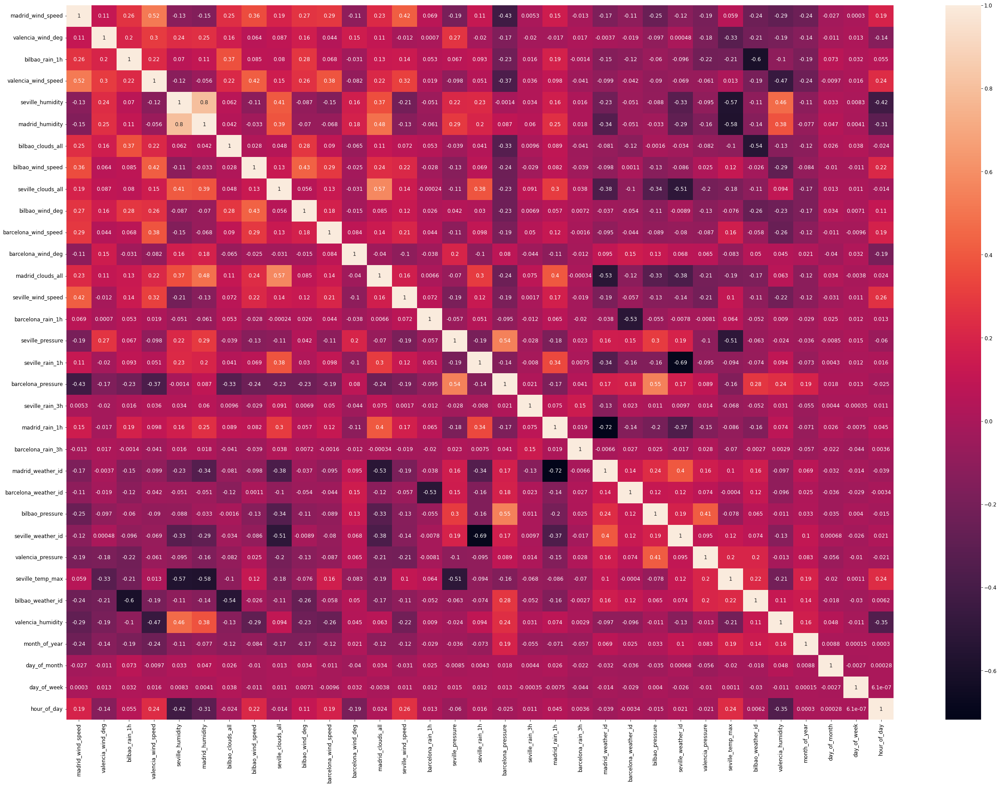

In [185]:
cd.plt.figure(figsize=[35,25])
cd.sb.heatmap(Xt.corr(),annot=True);

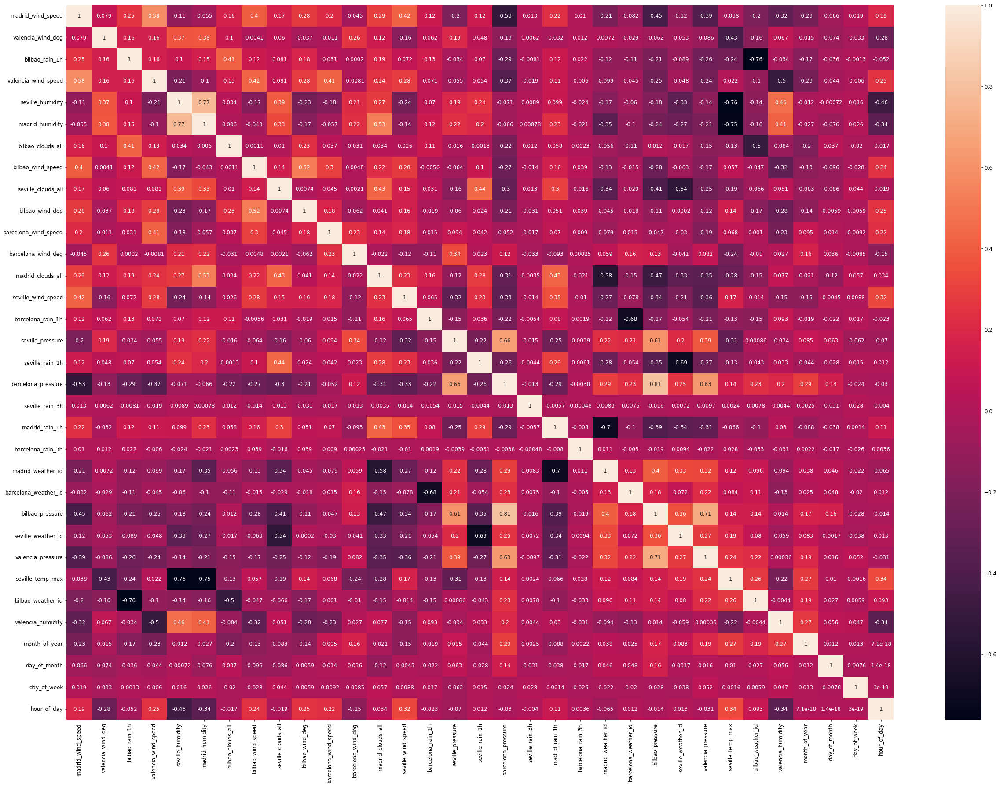

In [186]:
cd.plt.figure(figsize=[35,25])
cd.sb.heatmap(Xs.corr(),annot=True);

In [187]:
# engineer existing features

<a id="five"></a>
## 5. Modelling
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Modelling ⚡ |
| :--------------------------- |
| In this section, you are required to create one or more regression models that are able to accurately predict the thee hour load shortfall. |

---

In the following cells, models are trained to recognize certain patterns between weather features and the load_shortfall_3h. Models were provided with set of train weather data and algorithm that it can use to reason over and learn from those data features. After the model has been trained, then it can be used it to reason over data that it has not seen before, and make predictions about those data. Five models; Decision Tree, Lasso, Random Forest, Ridge and SVR were used and compared.

In [188]:
# create targets and features dataset
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state = 42)

In [189]:
#checking the shape of the training and testing data

print('Training predictor:', X_train.shape)
print('Training target:', y_train.shape)
print('Testing predictor:', X_test.shape)
print('Testing target:', y_test.shape)

Training predictor: (7010, 33)
Training target: (7010,)
Testing predictor: (1753, 33)
Testing target: (1753,)


**MODELS**

**Random Forest model**

Random Forest Regression algorithms use the combination of multiple random decision trees each trained on a subset of data. The use of multiple trees gives stability to the algorithm and reduces variance. The random forest regression algorithm is a commonly used model due to its ability to work well for large and most kinds of data.

In [190]:
# Our forest consists of 200 trees with a max depth of 8 
rf = RandomForestRegressor(n_estimators=200, max_depth=8)
# Fitting the model
rf.fit(X_train,y_train)
rf_predict = rf.predict(X_test)

**Instantiate support vector regression model**

Support vector regression model supports linear and non-linear regression. The mission with this model is to fit as many instances as possible between the lines while limiting the margin violations. SVR is powerful because it allows us to choose how tolerant we are of errors.

In [191]:
# Instantiate support vector regression model
sv_r = SVR(kernel='rbf', gamma='auto')
# Train the model
sv_r.fit(X_train,y_train)
# Get predictions
sv_pred = sv_r.predict(X_test)

**Decision tree model**

Decision tree algorithm algorithm is used for classification and regression modeling where trees are used to either classify data or predict what will come next. With decision tree the goal is to create a model that predicts the value of a target variable by learning simple decision rules inferred from the data features.

In [192]:
rt = DecisionTreeRegressor(random_state=42)
# Fitting the model
rt.fit(X_train,y_train)
t_pred = rt.predict(X_test)

**LASSO model**

Least Absolute Shrinkage and Selection Operator (LASSO), encourages simple and sparse models (i.e. models with fewer parameters. This type of regression is well-suited for models showing high levels of multicollinearity or when you want to automate certain parts of model selection, like weather variable selection/parameter elimination.

In [193]:
lasso = Lasso(alpha=0.01)
# Train the LASSO model
lasso.fit(X_train,y_train)
# Get predictions
lasso_pred = lasso.predict(X_test)

**Ridge model**

Ridge regression is one of the popular models because it uses regularization for making predictions and regularization is intended to resolve the problem of overfitting the model to the datapoints. This minimizes bias in our model fitting. This method can be used to analyse any data that suffers from multicollinearity, in other words this technique eliminate multicollinearity in data models.

In [194]:
# Creating Ridge model
Ridge = Ridge()
# Train the model
Ridge.fit(X_train,y_train)
# Get predictions
Ridge_pred = Ridge.predict(X_test)

In [195]:
df_test['load_shortfall_3h'] = rf.predict(Xp)

In [196]:
lg_submission = df_test[['time', 'load_shortfall_3h']]
lg_submission.to_csv('lg_submission_load_shortfall.csv', index = False)

**Evaluating models**

In [197]:
R_forest = cd.pd.DataFrame({'Actual': y_test, 'Predicted': rf_predict})
Lass_ = cd.pd.DataFrame({'Actual': y_test, 'Predicted': lasso_pred})
Ridge_ = cd.pd.DataFrame({'Actual': y_test, 'Predicted': Ridge_pred})
Svr = cd.pd.DataFrame({'Actual': y_test, 'Predicted': sv_pred})
D_tree = cd.pd.DataFrame({'Actual': y_test, 'Predicted': t_pred})

In [198]:
print(Lass_.head()) # Lasso Model
print('\n')
print(Ridge_.head()) # Ridge Model
print('\n')
print(Svr.head()) #SVR Model
print('\n')
print(D_tree.head()) #Decision Tree Model
print('\n')
print(R_forest.head()) # Random Forest Model

      Actual     Predicted
1226   11450  12529.005139
7903   13693  11899.610264
1559   18337  12657.343309
3621   -1221   9244.157114
7552    8515  13401.745024


      Actual     Predicted
1226   11450  12524.263585
7903   13693  11881.381378
1559   18337  12691.658301
3621   -1221   9245.920888
7552    8515  13362.347350


      Actual     Predicted
1226   11450  11100.499999
7903   13693  11100.499999
1559   18337  11100.499999
3621   -1221  11100.499999
7552    8515  11100.499999


      Actual  Predicted
1226   11450     5661.0
7903   13693    10484.0
1559   18337    19574.0
3621   -1221     -226.0
7552    8515    16355.0


      Actual     Predicted
1226   11450   7840.415190
7903   13693  15321.278067
1559   18337  15135.960373
3621   -1221   4011.816123
7552    8515  11627.981990


<a id="six"></a>
## 6. Model Performance
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model performance ⚡ |
| :--------------------------- |
| In this section you are required to compare the relative performance of the various trained ML models on a holdout dataset and comment on what model is the best and why. |

---

### In the following cells, model are being compared for the best performance using Root mean squared error(RMSE), mean squared error(MSE), r squared(R²), mean absolute error(MAE).

#### RMSE: The lower the RMSE, the better a given model is able to “fit” a dataset.

##### Comparing the performance using Root Mean Square Error across the Models used for prediction

In [199]:
performance = { 
    
                      'Test RMSE':
                    
                        {"Ridge": cd.np.sqrt(metrics.mean_squared_error(y_test,Ridge_pred)),
                        "Lasso" : cd.np.sqrt(metrics.mean_squared_error(y_test,lasso_pred)),
                         "SVR" : cd.np.sqrt(metrics.mean_squared_error(y_test,sv_pred)),
                        "Decision Tree" : cd.np.sqrt(metrics.mean_squared_error(y_test,t_pred)),
                        "Random Forest" : cd.np.sqrt(metrics.mean_squared_error(y_test,rf_predict))}
                        
                    }

# create dataframe from dictionary
RMSE_performance = cd.pd.DataFrame(data=performance)
RMSE_performance

,Test RMSE
Decision Tree,3976.546446
Lasso,4843.646725
Random Forest,3401.878803
Ridge,4847.613374
SVR,5322.158254


In [200]:
px.bar(RMSE_performance, y =RMSE_performance['Test RMSE'],
       color = RMSE_performance.index, width =700, height=400)

#### MSE: MSE checks how close estimates or forecasts are to actual values. Lower the MSE, the closer is forecast to actual value

##### Comparing the performance using Mean Squared Error across the Models used for prediction

In [201]:
performance1 = { 
    
                      'Test MSE':
                    
                        {"Ridge": (metrics.mean_squared_error(y_test,Ridge_pred)),
                        "Lasso" : (metrics.mean_squared_error(y_test,lasso_pred)),
                         "SVR" : (metrics.mean_squared_error(y_test,sv_pred)),
                        "Decision Tree" : (metrics.mean_squared_error(y_test,t_pred)),
                        "Random Forest" : (metrics.mean_squared_error(y_test,rf_predict))}
                        
                    }

# create dataframe from dictionary
MSE_performance = cd.pd.DataFrame(data=performance1)
MSE_performance

,Test MSE
Decision Tree,1.581292e+07
Lasso,2.346091e+07
Random Forest,1.157278e+07
Ridge,2.349936e+07
SVR,2.832537e+07


In [202]:
px.bar(MSE_performance, y =MSE_performance['Test MSE'],
       color = MSE_performance.index, width =700, height=400)

#### R²: Indicates the percentage of the variance in the dependent variable that the independent variables explain collectively. This is a strength of the relationship between your model and the dependent variable on a 0 – 100% scale. 0% represents a model that does not explain any of the variation in the response variable around its mean. 100% represents a model that explains all the variation in the response variable around its mean.

##### Comparing the performance using R² across the Models used for prediction

In [203]:
performance2 = { 
    
                      'Test R^2':
                    
                        {"Ridge": (metrics.r2_score(y_test,Ridge_pred)),
                        "Lasso" : (metrics.r2_score(y_test,lasso_pred)),
                         "SVR" : (metrics.r2_score(y_test,sv_pred)),
                        "Decision Tree" : (metrics.r2_score(y_test,t_pred)),
                        "Random Forest" : (metrics.r2_score(y_test,rf_predict))}
                        
                    }

# create dataframe from dictionary
R2_performance = cd.pd.DataFrame(data=performance2)
R2_performance

,Test R^2
Decision Tree,0.438505
Lasso,0.166936
Random Forest,0.589067
Ridge,0.165571
SVR,-0.005794


In [204]:
px.bar(R2_performance, y =R2_performance['Test R^2'],
       color = R2_performance.index, width =700, height=400)

#### MAE: Mean absolute error tells us the magnitude of difference between the prediction of an observation and the true value of that observation. Like RMSE, lower values are better and means the model can make better predictions compared to their values are higher.

##### Comparing the performance using Mean Absolute Error across the Models used for prediction

In [205]:
performance3 = { 
    
                      'Test MAE':
                    
                        {"Ridge": (metrics.mean_absolute_error(y_test,Ridge_pred)),
                        "Lasso" : (metrics.mean_absolute_error(y_test,lasso_pred)),
                         "SVR" : (metrics.mean_absolute_error(y_test,sv_pred)),
                        "Decision Tree" : (metrics.mean_absolute_error(y_test,t_pred)),
                        "Random Forest" : (metrics.mean_absolute_error(y_test,rf_predict))}
                        
                    }

# create dataframe from dictionary
MAE_performance = cd.pd.DataFrame(data=performance3)
MAE_performance

,Test MAE
Decision Tree,2919.033086
Lasso,3847.791844
Random Forest,2704.176219
Ridge,3849.387913
SVR,4248.297067


In [206]:
px.bar(MAE_performance, y =MAE_performance['Test MAE'],
       color = MAE_performance.index, width =700, height=400)

**BEST MODEL**

After evaluations, the best model was **Random Forest**, simply because it has the lowest root mean squared error(RMSE), mean squared error(MSE), mean absolute error(MAE), and a higher r-squared (R²) which means that the model as compared to the rest is capable of explaining 58.76 % of variation in the load_shortfall_3h between fossil fuels and renewable energy source as affected by the weather conditions.

<a id="seven"></a>
## 7. Model Explanations
<a class="anchor" id="1.1"></a>
<a href=#cont>Back to Table of Contents</a>

---
    
| ⚡ Description: Model explanation ⚡ |
| :--------------------------- |
| In this section, you are required to discuss how the best performing model works in a simple way so that both technical and non-technical stakeholders can grasp the intuition behind the model's inner workings. |

---

### Our Best Performing Models is Random Forest

Random forest is a machine learning algorithmic technique wherein many algorithms operate and work together. Hence, perform better than any of the individual algorithms.  
A random forest acts as an estimator algorithm that aggregates the result of many decision trees and then outputs the most optimal result. These trees protect each other from their individual errors even though there is no interraction between the trees

In [207]:
# discuss chosen methods logic

In [208]:
df_train.to_csv('train_clean.csv', index = False, encoding='utf-8')
df_test.to_csv('test_clean.csv', index = False, encoding='utf-8')